# Optimizing parameters of coarse grained nanomotif model

Bayesian optimization with BoTorch implementation

Mechanical properties of motifs were captured in angle distributions from oxDNA simulations at nucleotide resolution. These serve as target for parameter optimization in a coarse grained model representing 8 nucleotides as single particle.

Include code for (5D+1D) +1D +1D problem (combined optimization)

Bayesian optimization set up as 1D+(4D&1D)+1D+1D problem (split optimization)


X-motif design used in Corad et al Increasing valence pushes DNA nanostar networks to the isostatic point

In [1]:
%load_ext autoreload
%autoreload 2

# Import

In [2]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import readdy
import math
import scipy
import pandas as pd
from sklearn.preprocessing import FunctionTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler
import contextlib
import io
import pickle
import torch
from botorch.models import SingleTaskGP
from botorch.models.transforms import Normalize, Standardize
from botorch.fit import fit_gpytorch_mll
from gpytorch.mlls import ExactMarginalLogLikelihood
from gpytorch.likelihoods import FixedNoiseGaussianLikelihood
from botorch.acquisition import LogExpectedImprovement
from botorch.acquisition import ExpectedImprovement
from botorch.acquisition import UpperConfidenceBound
from botorch.optim import optimize_acqf
import itertools
from scipy.stats import wasserstein_distance,kstest

import sys
import os
#sys.path.append(os.path.abspath(os.path.join('..', 'python_scripts')))

from NCG_readdy_sim_4 import Debye_length, Debye_Hueckel_pot_rep_strength ,Diff_at23C,visc_T,Diff_ES

from NCG_readdy_sim_4 import run_sim_3,tcl_file_gen_3,all_types

from NCG_Bay_opt_readdy_sim_3 import run_p,run_p_dict,gt_1_3,gt_1_1,gt_1_2,gt_1_4, cg_angle_distr_c1_4_ba_aa_oa_la,cg_angle_distr_c1_1_hp,cg_angle_distr_c1_1_bm, eval_sim_c1_1_la,eval_sim_c1_1_hp,eval_sim_c1_1_aa,eval_sim_c1_2_ba_oa, eval_sim_c1_4_ba_aa_oa_la,eval_sim_c1_1_bm,apply_gp, run_gp_11

from NCG_Bay_opt_readdy_sim_3 import gen_all_comb_from_list_of_lists_2,eval_sim_c1_3_aa_ba_oa

> **Note on file paths and data availability**
>
> This notebook was originally run on the author's local machine and contains **absolute file paths**
> (e.g. `/home/aaron/...`, `/mnt/d/...`) pointing to simulation output, trajectory, and target-angle files.
> These paths will need to be updated to match your own local folder structure before the notebook can be
> run as-is.
>
> The simulation data referenced throughout this notebook (oxDNA, ReaDDy) is available on Zenodo:
> **https://doi.org/10.5281/zenodo.18338015**
>
> For a shorter, self-contained walkthrough of the overall workflow using local relative paths, see
> `tutorial_workflow.ipynb` in this repository.

# Units and temperature

In [3]:
#Set units used in ReaDDy and simulation temperature
custom_units = {'length_unit':'nanometer',
                'time_unit': 'nanoseconds',
                'energy_unit': 'joule'}
system_temperature=273.15 + 20  #293
kbt=system_temperature*1.380649*10**-23

# Diffusion constant

In [4]:
#Diffusion constant either based on Einstein-Smoluchowski, or on exp results for oligos at 23°C
# viscositiy: https://srd.nist.gov/jpcrdreprint/1.555581.pdf
# scaling diffusion constant with T: https://en.wikipedia.org/wiki/Einstein_relation_(kinetic_theory)
# Diffusion constant DNA oligos at 23°C: https://www.sciencedirect.com/science/article/pii/S0021925818310871


#Diffusion const for BP of ds DNA (known at 23°C)
Diff_at23C_1=Diff_at23C(8)

#Viscosity water at sim temp and 23°C
visc_T_sys=visc_T(system_temperature)
visc_T_23=visc_T(273.15+23)

#rescale diffusion const to sim temperature and viscosity (assume scaling like Einstein-Smoluchowski D= kb*T/(6*pi*r*visc) )
Diff_sys_temp=Diff_at23C_1*system_temperature/(23+273.15)  *visc_T_23/visc_T_sys

#use Einstein-Smoluchowski for sphere
Diff_sys_temp_ES=Diff_ES(T=system_temperature,r=2.72/2 *10**-9,eta=visc_T_sys)*10**9
Diff_T_23_ES=Diff_ES(T=23+273.15,r=2.72/2 *10**-9,eta=visc_T_sys)*10**9


print("D for 8bp at 23°C /",23+273.15,"K =",Diff_at23C_1,"nm^2/ns") 
print("D for sphere with r=2.72/2 nm at 23°C /",23+273.15,"K =", Diff_T_23_ES,"nm^2/ns")
print("############################################")
print("mu at",system_temperature-273.15,"°C /", system_temperature,"K =",visc_T_sys," Pa*s" )
print("mu at","23°C /", 23+273.15,"K =" ,visc_T_23," Pa*s" )
print("############################################")
print("D for 8bp at",system_temperature-273.15,"°C /",system_temperature,"K =",Diff_sys_temp,"nm^2/ns")
print("D for sphere with r=2.72/2 nm at" ,system_temperature-273.15,"°C /",system_temperature,"K =",Diff_sys_temp_ES,"nm^2/ns")


D for 8bp at 23°C / 296.15 K = 0.10964057118867664 nm^2/ns
D for sphere with r=2.72/2 nm at 23°C / 296.15 K = 0.15917954782180455 nm^2/ns
############################################
mu at 20.0 °C / 293.15 K = 0.0010019999999999999  Pa*s
mu at 23°C / 296.15 K = 0.0009322679783769826  Pa*s
############################################
D for 8bp at 20.0 °C / 293.15 K = 0.10097700765460783 nm^2/ns
D for sphere with r=2.72/2 nm at 20.0 °C / 293.15 K = 0.15756705873362153 nm^2/ns


# Fixed model Parameters

In [5]:
###################
#fixed params:
###################

#bond potential
k_bond_ds=2*10**-19
k_bond_ss=1*10**-19

#bond eq. distance
eq_dist_bb=2.72 

#bond eq. distance fused sticky-ends
eq_dist_fused_bb=2/3 *2.72
eq_dist_bb_s=2/3 *2.72 # distance arm-stickyend

#bond potential surf
k_angle_ss_surf=2e-20  #2.8666666666666663e-20     #2*10**-21
k_angle_ds_surf=3.6666666666666664e-20     #2*10**-20

#angle between monomers V=k*(theta-theta_0)^2
theta_0=np.pi
theta_90=np.pi/2

theta_60=np.pi *1/3
theta_120=np.pi * 2/3
theta_270=np.pi * 3/2
theta_base_y=np.pi*2/3

#volume exclusion
#har rep
k_ex_ds_ds=2*10**-20  *5
k_ex_ss_ds=8*10**-21  *5
k_ex_ss_ss=4*10**-21  *5
dist_ex=1.5          *1 

#DH
c_NaCl = 150 # NaCl concentration in milli mol/L
L_1=6.022*10**23 *c_NaCl * (1.602*10**-19)**2 

charge_eff=0.815 #https://pubs.aip.org/aip/jcp/article/142/23/234901/193554/Introducing-improved-structural-properties-and
DH_len=Debye_length(L=L_1,T=system_temperature) *10**9 #for nm
DH_strength_ds_ds=Debye_Hueckel_pot_rep_strength(q1=charge_eff*16,q2=charge_eff*16,T=system_temperature)*10**9 #for nm
DH_strength_ss_ds=Debye_Hueckel_pot_rep_strength(q1=charge_eff*8,q2=charge_eff*16,T=system_temperature)*10**9 #for nm
DH_strength_ss_ss=Debye_Hueckel_pot_rep_strength(q1=charge_eff*8,q2=charge_eff*8,T=system_temperature)*10**9 #for nm
DH_cutoff=DH_len*4

volume_excl_type="DH"

print("Debye length at",c_NaCl,"mM NaCl:", DH_len, "nm", "cutoff at", DH_cutoff, "nm")
print("DH pot strength ds-ds:", DH_strength_ds_ds, "J*nm")
print("DH pot strength ss-ds:", DH_strength_ss_ds, "J*nm")
print("DH pot strength ss-ss:", DH_strength_ss_ss, "J*nm")
print("Energy of rep. ds-ds at 1 nm:",DH_strength_ds_ds/1 *np.exp(-1/DH_len),"J" )
#DH_strength_ds_ds=DH_strength_ds_ds
#DH_strength_ss_ds=DH_strength_ss_ds
#DH_strength_ss_ss=DH_strength_ss_ss
#DH_cutoff=DH_cutoff

#probabilities bound/unbound
p_SE_fused_x=99.8
p_SE_fused_ortho_x=99.8

p_SE_HP_x=83.8
p_SE_HP_ortho_x=59.9

p_surf_HP_x=6.6
p_surf_HP_ortho_x=6.6

#binding/unbinding rates
#rate of selecting fission reaction in sim
k_fiss_rate_sel=10**7
#y motif
k_b_y_1=0.05
k_ub_y_1=0.001

#y motif hp
k_b_y_hp_1=0
k_ub_y_hp_1=0

#############

#x motif 1
k_b_x_1=0     #0.05
k_ub_x_1=0    #k_b_x_1 * (100-p_SE_fused_x)/p_SE_fused_x  #0.001

#x motif 1 surface
k_b_x_surf_1=k_b_x_1 
k_ub_x_surf_1=k_ub_x_1

#x motif 1 hp
k_b_x_hp_1=0      #0.005
k_ub_x_hp_1=0      #k_b_x_hp_1 * (100-p_SE_HP_x)/p_SE_HP_x 

#x motif 1 surf hp
k_b_x_surf_hp_1=0     #0.005
k_ub_x_surf_hp_1=0     #k_b_x_surf_hp_1 * (100-p_surf_HP_x)/p_surf_HP_x

############

#x motif 2
k_b_x_2=0
k_ub_x_2=0

#x motif 2 surface
k_b_x_surf_2=0 
k_ub_x_surf_2=0

#x motif 2 hp
k_b_x_hp_2=0
k_ub_x_hp_2=0

#x motif 2 surf hp
k_b_x_surf_hp_2=0
k_ub_x_surf_hp_2=0

############

#x motif conrad

#x motif 1
k_b_x_c1=0    #0.05
k_ub_x_c1=0    #k_b_x_1 * (100-p_SE_fused_x)/p_SE_fused_x  #0.001

#x motif 1 hp
k_b_x_hp_c1=0      #0.005
k_ub_x_hp_c1=0      #k_b_x_hp_1 * (100-p_SE_HP_x)/p_SE_HP_x 


#time step
t_step=10*10**-3  #standard: 10*10**-3 #appears to work with up to 25*10**-3

#reaction scale
rea_s=2.7
rea_c1_s=2.7


Debye length at 150 mM NaCl: 0.7868499834578314 nm cutoff at 3.1473999338313257 nm
DH pot strength ds-ds: 4.897431587169134e-19 J*nm
DH pot strength ss-ds: 2.448715793584567e-19 J*nm
DH pot strength ss-ss: 1.2243578967922835e-19 J*nm
Energy of rep. ds-ds at 1 nm: 1.374129742867169e-19 J


# General simulation parameters

In [6]:
#general simulation parameters
system_temperature=system_temperature
box_size=[150,150,150]
custom_units=custom_units
periodic_bc_x=False
periodic_bc_y=False
periodic_bc_z=False

r_sp=15 #radius of spherical inclusion pot
sp_incl_orig=[0,0,0] #origin of sperical inclusion pot
k_sp=0 #k of spherical inclusion, if zero no spherical inclusion
box_a=[-60,-60,-60] #offset of box potential from centre
box_b=[120,120,120] #total length of box potential
k_box=1 *10**-20 #k of box potential


#number of particles
num_y_motif_1=0
num_x_motif_1=0
num_x_motif_2=0
num_x_motif_c1=1
num_surface_1=0

#surface section lengths
num_rep_unit=1
len_fill_surf_a=2
len_binding_surf=4
len_fill_surf_b=2


#option to use HP template
use_y_1_HP_template=False
use_x_1_HP_template=False
use_x_2_HP_template=False
use_x_c1_HP_template=False

#positions of particles
y_motif_1_ini=[np.asarray([[0,0,0]])]
y_motif_1_rot=False

x_motif_1_ini=[np.asarray([[0,0,0]])]
x_motif_1_rot=False

x_motif_2_ini=[np.asarray([[-10,0,0]])]
x_motif_2_rot=False

x_motif_c1_ini=[np.asarray([[0,0,0]])] #[np.asarray([[0,0,0]])]
x_motif_c1_rot=False

surf_1_ini=[np.asarray([[-40,-40,-40]])]

#time steps
t_tot=500000  #500000

#evaluate reactions


#folder
folder="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/unopt_test_1/"
name="x_test_1_"
add_num_1=0
     

#other options

sim_kernel="SingleCPU"
sim_threads=1
track_num_particles=["y_link_a_1","y_link_fused_a_1","y_link_b_1","y_link_fused_b_1","y_link_c_1","y_link_fused_c_1",
                                                                   "x_link_a_1","x_link_fused_a_1","x_link_b_1","x_link_fused_b_1","x_link_c_1","x_link_fused_c_1","x_surf_link_d_1","x_surf_link_fused_d_1",
                                                                    "x_link_a_2","x_link_fused_a_2","x_link_b_2","x_link_fused_b_2","x_link_c_2","x_link_fused_c_2","x_surf_link_d_2","x_surf_link_fused_d_2",
                                                                    'x_link_hp_a_1', 'x_link_hp_b_1', 'x_link_hp_c_1',"x_surf_link_hp_d_1",
                                                                    'x_link_hp_a_2', 'x_link_hp_b_2', 'x_link_hp_c_2',"x_surf_link_hp_d_2",
                                                                    "x_link_a_c1","x_link_fused_a_c1","x_link_b_c1","x_link_fused_b_c1","x_link_c_c1","x_link_fused_c_c1","x_link_d_c1","x_link_fused_d_c1",
                                                                    'x_link_hp_a_c1', 'x_link_hp_b_c1', 'x_link_hp_c_c1',"x_link_hp_d_c1",
                                                                   ]
eval_reac=True
eval_top_reac=True

checkpoint_path=None #"ML_parameter_opt_1/NCG_test_1/"

new_checkpoint=None
max_n_saves=1 #max checkpoint saves
rec_stride=100 #recording stride
sim_skin=1000 #simulation skin






# Variable model parameters

In [7]:
#specify which parameters are to be optimised over which range

#wide param range
k_angle_ds_base_range=np.array([1*10**-24,1*10**-22,1*10**-20,1*10**-18])   #np.linspace(1*10**-24  ,1*10**-18 ,10) 
k_angle_ds_arm_range=np.array([1*10**-24,1*10**-22,1*10**-20,1*10**-18])   #np.linspace(1*10**-24  ,1*10**-18 ,10)
k_angle_ds_oppa_range=np.array([1*10**-24,1*10**-22,1*10**-20,1*10**-18])   #np.linspace(1*10**-24  ,1*10**-18 ,10)
k_angle_ss_link_range=np.array([1*10**-24,1*10**-22,1*10**-20,1*10**-18])   #np.linspace(1*10**-24  ,1*10**-18 ,10)
k_angle_ds_fused_link_range=np.array([1*10**-24,1*10**-22,1*10**-20,1*10**-18])   #np.linspace(1*10**-24  ,1*10**-18 ,10)
k_angle_ds_hp_range=np.array([1*10**-24,1*10**-22,1*10**-20,1*10**-18])   #np.linspace(1*10**-24  ,1*10**-18 ,10)
theta_base_x_range=np.linspace(75 ,120 ,4)*np.pi/180 #np.linspace(40 ,120 ,10)
theta_oppa_x_range=np.linspace(135 ,180 ,4)*np.pi/180 #np.linspace(140 ,180 ,10)



#Prior to optimization, use parameter value from middle of range for unoptimized sim
k_angle_ds_base=k_angle_ds_base_range[2]
k_angle_ds_arm=k_angle_ds_arm_range[2]
k_angle_ds_oppa=k_angle_ds_oppa_range[2]
k_angle_ss_link=k_angle_ss_link_range[2]
k_angle_ds_fused_link=k_angle_ds_fused_link_range[2]
k_angle_ds_hp=k_angle_ds_hp_range[2]
theta_base_x=theta_base_x_range[2]
theta_oppa_x=theta_oppa_x_range[2]



In [8]:
#input dictionary
run_sim_1_input={"name":name,
             "folder":folder,
             "add_num_1":add_num_1,
              
             "system_temperature":system_temperature,
             "box_size":box_size,
             "custom_units":custom_units,
             "periodic_bc_x":periodic_bc_x,
             "periodic_bc_y":periodic_bc_y,
             "periodic_bc_z":periodic_bc_z,
              
             "r_sp":r_sp,
             "sp_incl_orig":sp_incl_orig,
             "k_sp":k_sp,
             "box_a":box_a,
             "box_b":box_b,
             "k_box":k_box,
    
              
             "num_y_motif_1":num_y_motif_1,
             "num_x_motif_1":num_x_motif_1,
             "num_x_motif_2":num_x_motif_2,
             "num_x_motif_c1":num_x_motif_c1,
             "num_surface_1":num_surface_1,
             "num_rep_unit":num_rep_unit,
             "len_fill_surf_a":len_fill_surf_a,
             "len_binding_surf":len_binding_surf,
             "len_fill_surf_b":len_fill_surf_b,
             "y_motif_1_ini":y_motif_1_ini,
             "x_motif_1_ini":x_motif_1_ini,
             "x_motif_2_ini":x_motif_2_ini,
             "x_motif_c1_ini":x_motif_c1_ini,
             "surf_1_ini":surf_1_ini,
             "y_motif_1_rot":y_motif_1_rot,
             "x_motif_1_rot":x_motif_1_rot,
             "x_motif_2_rot":x_motif_2_rot,
             "x_motif_c1_rot":x_motif_c1_rot,
                 
             "use_y_1_HP_template":use_y_1_HP_template,
             "use_x_1_HP_template":use_x_1_HP_template,
             "use_x_2_HP_template":use_x_2_HP_template,
             "use_x_c1_HP_template":use_x_c1_HP_template,
                 
             "Diff_sys_temp":Diff_sys_temp,
             "k_bond_ds":k_bond_ds,
             "k_bond_ss":k_bond_ss,
             "eq_dist_bb":eq_dist_bb,
             "eq_dist_fused_bb":eq_dist_fused_bb,
             "eq_dist_bb_s":eq_dist_bb_s,
             "k_angle_ds_base":k_angle_ds_base,
             "k_angle_ds_arm":k_angle_ds_arm,
             "k_angle_ds_oppa":k_angle_ds_oppa,
             "k_angle_ss_link":k_angle_ss_link,
             "k_angle_ds_fused_link":k_angle_ds_fused_link,
             "k_angle_ds_hp":k_angle_ds_hp,
             "k_angle_ss_surf":k_angle_ss_surf,
             "k_angle_ds_surf":k_angle_ds_surf,
             "theta_0":theta_0,
             "theta_90":theta_90,
             "theta_60":theta_60,
             "theta_120":theta_120,
             "theta_270":theta_270,
             "theta_base_x":theta_base_x,
             "theta_base_y":theta_base_y,
             "theta_oppa_x":theta_oppa_x,
             
             "volume_excl_type":volume_excl_type,
             "k_ex_ds_ds":k_ex_ds_ds,
             "k_ex_ss_ds":k_ex_ss_ds,
             "k_ex_ss_ss":k_ex_ss_ss,
             "dist_ex":dist_ex,
             "DH_strength_ds_ds":DH_strength_ds_ds,
             "DH_strength_ss_ds":DH_strength_ss_ds,
             "DH_strength_ss_ss":DH_strength_ss_ss,
             "DH_len":DH_len,
             "DH_cutoff":DH_cutoff,
              
              
             "k_fiss_rate_sel":k_fiss_rate_sel,
             "k_b_y_1":k_b_y_1,
             "k_ub_y_1":k_ub_y_1,
             "k_b_y_hp_1":k_b_y_hp_1,
             "k_ub_y_hp_1":k_ub_y_hp_1,
             "k_b_x_1":k_b_x_1,
             "k_ub_x_1":k_ub_x_1,
             "k_b_x_surf_1":k_b_x_surf_1,
             "k_ub_x_surf_1":k_ub_x_surf_1,
             "k_b_x_hp_1":k_b_x_hp_1,
             "k_ub_x_hp_1":k_ub_x_hp_1,
             "k_b_x_surf_hp_1":k_b_x_surf_hp_1,
             "k_ub_x_surf_hp_1":k_ub_x_surf_hp_1,
             "k_b_x_2":k_b_x_2,
             "k_ub_x_2":k_ub_x_2,
             "k_b_x_surf_2":k_b_x_surf_2,
             "k_ub_x_surf_2":k_ub_x_surf_2,
             "k_b_x_hp_2":k_b_x_hp_2,
             "k_ub_x_hp_2":k_ub_x_hp_2,
             "k_b_x_surf_hp_2":k_b_x_surf_hp_2,
             "k_ub_x_surf_hp_2":k_ub_x_surf_hp_2,
             "k_b_x_c1":k_b_x_c1,
             "k_ub_x_c1":k_ub_x_c1,
             "k_b_x_hp_c1":k_b_x_hp_c1,
             "k_ub_x_hp_c1":k_ub_x_hp_c1,
                 
             "t_step":t_step,
             "rea_s":rea_s,
             "rea_c1_s":rea_c1_s,
             "t_tot":t_tot,
             
             "sim_kernel":sim_kernel,
             "sim_threads":sim_threads,
             "track_num_particles":track_num_particles,
             "eval_reac":eval_reac,
             "eval_top_reac":eval_top_reac,
             "checkpoint_path":checkpoint_path,
             "new_checkpoint":new_checkpoint,
             "max_n_saves":max_n_saves,
             "rec_stride":rec_stride,
             "sim_skin":sim_skin
    
    
}

# Run unoptimized sim

These can later be compared to the optimized simulations

In [51]:
#run regular sim setup
#run multiple copys of sim in parallel
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(1):
    gen_sim_list.append(run_sim_3)
    run_sim_1_input_c=run_sim_1_input.copy()
    run_sim_1_input_c["folder"]="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/fusing_test/"
    run_sim_1_input_c["name"]="x_test_1_"
    run_sim_1_input_c["add_num_1"]=i
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

Configured kernel context with:
--------------------------------
 - kBT = 4.0473725435e-21
 - periodic b.c. = (false, false, false)
 - box size = (150, 150, 150)
 - particle types:
     * Topology particle type "x_link_hp_d_c1" with D=0.10097700765460783
     * Topology particle type "x_link_hp_c_c1" with D=0.10097700765460783
     * Topology particle type "x_link_hp_b_c1" with D=0.10097700765460783
     * Topology particle type "x_link_hp_a_c1" with D=0.10097700765460783
     * Topology particle type "x_link_fused_d_c1" with D=0.10097700765460783
     * Topology particle type "x_link_fused_c_c1" with D=0.10097700765460783
     * Topology particle type "x_link_fused_b_c1" with D=0.10097700765460783
     * Topology particle type "x_link_fused_a_c1" with D=0.10097700765460783
     * Topology particle type "x_link_d_c1" with D=0.10097700765460783
     * Topology particle type "x_arm_d_c1" with D=0.10097700765460783
     * Topology particle type "x_base_arm_d_c1" with D=0.10097700765460783

100%|██████████████████████████████████████████████████████████████████████| 5000000/5000000 [06:53<00:00, 12092.14it/s]


In [14]:
traj_read=readdy.Trajectory("/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/unopt_test_1/x_test_1_0.h5")
time_e, energy=traj_read.read_observable_energy()
times,types,ids,part_positions=traj_read.read_observable_particles()

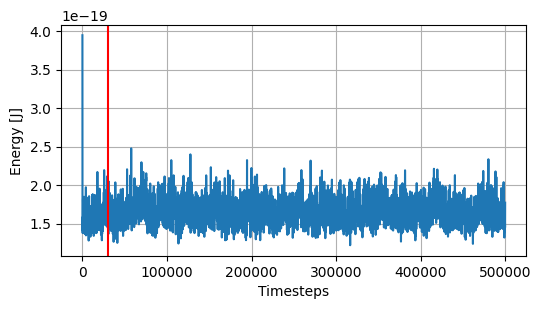

In [15]:
plt.figure(figsize=(6,3))
plt.plot(time_e[:],energy[:])
plt.ylabel("Energy [J]")
plt.xlabel("Timesteps")
plt.axvline(time_e[300],color="red")
plt.grid()

In [16]:
radii={}
for i in range(len(all_types)):
    radii[all_types[i]]=1.36
traj_read.convert_to_xyz(particle_radii=radii)

In [17]:
traj_file="x_test_1_0.h5.xyz"
box_dim_s="50 50 50"
tcl_file_1=tcl_file_gen_3(traj_file,box_dim_s)

np.savetxt("/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/unopt_test_1/tcl_x_test_1_0.xyz.tcl",tcl_file_1,delimiter=" ", fmt="%s")

In [27]:
#run sim setup for HP

#run multiple copys of sim in parallel
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(5):
    gen_sim_list.append(run_sim_3)
    run_sim_1_input_c=run_sim_1_input.copy()
    run_sim_1_input_c["folder"]="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/unpot_test_HP_1/"
    run_sim_1_input_c["name"]="x_test_hp_1_"
    run_sim_1_input_c["add_num_1"]=0
    run_sim_1_input_c["use_x_c1_HP_template"]=True
    run_sim_1_input_c["add_num_1"]=i
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

Configured kernel context with:
--------------------------------
 - kBT = 4.0473725435e-21
 - periodic b.c. = (false, false, false)
 - box size = (150, 150, 150)
 - particle types:
     * Topology particle type "x_link_hp_d_c1" with D=0.10097700765460783
     * Topology particle type "x_link_hp_c_c1" with D=0.10097700765460783
     * Topology particle type "x_link_hp_b_c1" with D=0.10097700765460783
     * Topology particle type "x_link_hp_a_c1" with D=0.10097700765460783
     * Topology particle type "x_link_fused_d_c1" with D=0.10097700765460783
     * Topology particle type "x_link_fused_c_c1" with D=0.10097700765460783
     * Topology particle type "x_link_fused_b_c1" with D=0.10097700765460783
     * Topology particle type "x_link_fused_a_c1" with D=0.10097700765460783
     * Topology particle type "x_link_d_c1" with D=0.10097700765460783
     * Topology particle type "x_arm_d_c1" with D=0.10097700765460783
     * Topology particle type "x_base_arm_d_c1" with D=0.10097700765460783

  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.0473725435e-21
 - periodic b.c. = (false, false, false)
 - box size = (150, 150, 150)
 - particle types:
     * Topology particle type "x_link_hp_d_c1" with D=0.10097700765460783
     * Topology particle type "x_link_hp_c_c1" with D=0.10097700765460783
     * Topology particle type "x_link_hp_b_c1" with D=0.10097700765460783
     * Topology particle type "x_link_hp_a_c1" with D=0.10097700765460783
     * Topology particle type "x_link_fused_d_c1" with D=0.10097700765460783
     * Topology particle type "x_link_fused_c_c1" with D=0.10097700765460783
     * Topology particle type "x_link_fused_b_c1" with D=0.10097700765460783
     * Topology particle type "x_link_fused_a_c1" with D=0.10097700765460783
     * Topology particle type "x_link_d_c1" with D=0.10097700765460783
     * Topology particle type "x_arm_d_c1" with D=0.10097700765460783
     * Topology particle type "x_base_arm_d_c1" with D=0.10097700765460783

  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]


Configured simulation loop with:
--------------------------------
 - timeStep = 0.01
 - evaluateObservables = true
 - progressOutputStride = 100
 - context written to file = true
 - Performing actions:
   * Initialize neighbor list? true
   * Update neighbor list? true
   * Clear neighbor list? true
   * Integrate diffusion? true
   * Calculate forces? true
   * Handle reactions? true
   * Handle topology reactions? true



  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:16<00:00, 30290.67it/s]


In [68]:
#run sim setup for bound arms

#run multiple copys of sim in parallel
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(5):
    gen_sim_list.append(run_sim_1)
    run_sim_1_input_c=run_sim_1_input.copy()
    run_sim_1_input_c["folder"]="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_4/unopt_test_2/"
    run_sim_1_input_c["name"]="x_test_ba_1_"
    run_sim_1_input_c["add_num_1"]=0
    run_sim_1_input_c["checkpoint_path"]="ML_parameter_opt_1/NCG_X_motif_4/two_fused_motifs_checkpoint/"
    run_sim_1_input_c["add_num_1"]=i
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (150, 150, 150)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
  

  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

Configured simulation loop with:
--------------------------------
 - timeStep = 0.01
 - evaluateObservables = true
 - progressOutputStride = 100
 - context written to file = true
 - Performing actions:
   * Initialize neighbor list? true
   * Update neighbor list? true
   * Clear neighbor list? true
   * Integrate diffusion? true
   * Calculate forces? true
   * Handle reactions? true
   * Handle topology reactions? true

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (150, 150, 150)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology par

  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.3235023435e-21
 - periodic b.c. = (false, false, false)
 - box size = (150, 150, 150)
 - particle types:
     * Topology particle type "x_surf_bound_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_int_1" with D=0.16558810339120872
     * Topology particle type "x_surf_fill_1" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_2" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_2" with D=0.16558810339120872
     * Topology particle type "x_surf_link_hp_d_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_c_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_b_1" with D=0.16558810339120872
     * Topology particle type "x_link_hp_a_1" with D=0.16558810339120872
  

  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

Configured simulation loop with:
--------------------------------
 - timeStep = 0.01
 - evaluateObservables = true
 - progressOutputStride = 100
 - context written to file = true
 - Performing actions:
   * Initialize neighbor list? true
   * Update neighbor list? true
   * Clear neighbor list? true
   * Integrate diffusion? true
   * Calculate forces? true
   * Handle reactions? true
   * Handle topology reactions? true



100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:35<00:00, 13914.84it/s]


# Bayesian optimization

## Angle distributions from oxDNA sim

In [9]:
#load target angles
values_angle_base_target=np.load("/home/aaron/phd/oxDNA_1/oxDNA/x_motif_conrad_et_al/target_angles_20deg_150NaCl/values_angle_base_target.npy")
values_angle_link_target=np.load("/home/aaron/phd/oxDNA_1/oxDNA/x_motif_conrad_et_al/target_angles_20deg_150NaCl/values_angle_link_target.npy")
values_angle_arm_axis_target=np.load("/home/aaron/phd/oxDNA_1/oxDNA/x_motif_conrad_et_al/target_angles_20deg_150NaCl/values_angle_arm_axis_target.npy")
values_angle_oppa_target=np.load("/home/aaron/phd/oxDNA_1/oxDNA/x_motif_conrad_et_al/target_angles_20deg_150NaCl/values_angle_oppa_target.npy")
values_angle_link_HP_target=np.load("/home/aaron/phd/oxDNA_1/oxDNA/x_motif_conrad_et_al/target_angles_20deg_150NaCl/values_angle_link_HP_target.npy")
values_angle_ds_fused_link_target=np.load("/home/aaron/phd/oxDNA_1/oxDNA/x_motif_conrad_et_al/target_angles_20deg_150NaCl/values_angle_ds_fused_link_target.npy")

In [10]:
#generate histograms of target angles
values_angle_base_target=values_angle_base_target.flatten()
values_angle_link_target=values_angle_link_target.flatten()
values_angle_arm_axis_target=values_angle_arm_axis_target.flatten()
values_angle_oppa_target=values_angle_oppa_target.flatten()
values_angle_link_HP_target=values_angle_link_HP_target.flatten()
values_angle_ds_fused_link_target=values_angle_ds_fused_link_target.flatten()

base_angle_distr_target=np.histogram(values_angle_base_target*180/np.pi,bins=np.arange(0,190,5),density=True)[0]
link_angle_distr_target=np.histogram(values_angle_link_target*180/np.pi,bins=np.arange(0,190,5),density=True)[0]
arm_axis_angle_distr_target=np.histogram(values_angle_arm_axis_target*180/np.pi,bins=np.arange(0,190,1),density=True)[0]
oppa_angle_distr_target=np.histogram(values_angle_oppa_target*180/np.pi,bins=np.arange(0,190,5),density=True)[0]
link_HP_angle_distr_target=np.histogram(values_angle_link_HP_target*180/np.pi,bins=np.arange(0,190,5),density=True)[0]
angle_ds_fused_link_distr_target=np.histogram(values_angle_ds_fused_link_target*180/np.pi,bins=np.arange(0,190,5),density=True)[0]

base_angle_distr_target=np.asarray(base_angle_distr_target)
link_angle_distr_target=np.asarray(link_angle_distr_target)
arm_axis_angle_distr_target=np.asarray(arm_axis_angle_distr_target)
oppa_angle_distr_target=np.asarray(oppa_angle_distr_target)
link_HP_angle_distr_target=np.asarray(link_HP_angle_distr_target)
angle_ds_fused_link_distr_target=np.asarray(angle_ds_fused_link_distr_target)


list_values_target_angles_1=[values_angle_base_target,values_angle_link_target,values_angle_arm_axis_target,values_angle_oppa_target,values_angle_link_HP_target,values_angle_ds_fused_link_target]

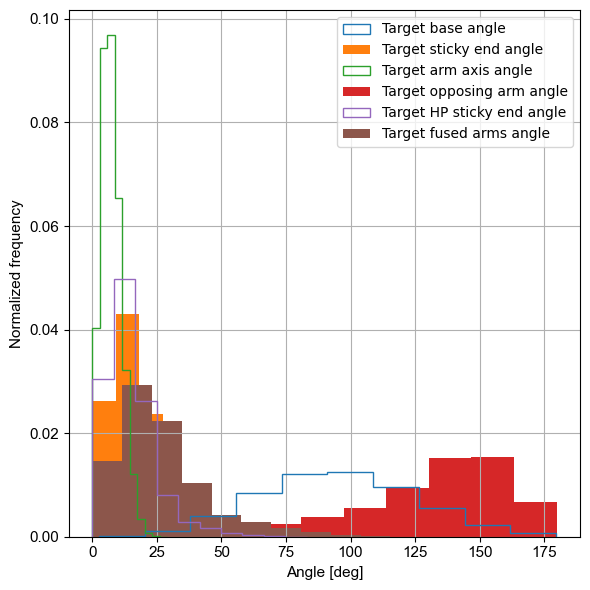

In [11]:
plt.figure(figsize=(6,6))
plt.hist(values_angle_base_target*180/np.pi,density=True,label="Target base angle",histtype="step")
plt.hist(values_angle_link_target*180/np.pi,density=True,label="Target sticky end angle",histtype="bar")
plt.hist(values_angle_arm_axis_target*180/np.pi,density=True,label="Target arm axis angle",histtype="step")
plt.hist(values_angle_oppa_target*180/np.pi,density=True,label="Target opposing arm angle",histtype="bar")
plt.hist(values_angle_link_HP_target*180/np.pi,density=True,label="Target HP sticky end angle",histtype="step")
plt.hist(values_angle_ds_fused_link_target*180/np.pi,density=True,label="Target fused arms angle",histtype="bar")


plt.legend()
plt.xlabel("Angle [deg]",fontname = "Arial",fontsize=11)
plt.ylabel("Normalized frequency",fontname = "Arial",fontsize=11)
plt.xticks(fontname = "Arial",fontsize=11)
plt.yticks(fontname = "Arial",fontsize=11)
plt.grid()
plt.tight_layout()

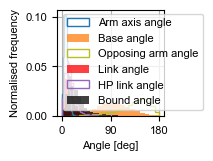

In [14]:
fig1=plt.figure(figsize=(3.5/2.54,3.5/2.54))
ax1 = fig1.add_subplot(111)
ax1.hist(values_angle_arm_axis_target*180/np.pi,density=True,label="Arm axis angle",histtype="step",bins=20,color="tab:blue")
ax1.hist(values_angle_base_target*180/np.pi,density=True,label="Base angle",histtype="bar",bins=20,alpha=0.75,color="tab:orange")
ax1.hist(values_angle_oppa_target*180/np.pi,density=True,label="Opposing arm angle",histtype="step",bins=20,color="tab:olive")
ax1.hist(values_angle_link_target*180/np.pi,density=True,label="Link angle",histtype="bar",alpha=0.75,bins=20,color="red")
ax1.hist(values_angle_link_HP_target*180/np.pi,density=True,label="HP link angle",histtype="step",bins=20,color="tab:purple")
ax1.hist(values_angle_ds_fused_link_target*180/np.pi,density=True,label="Bound angle",histtype="bar",alpha=0.75,bins=20,color="black")

fs1=8
plt.legend(prop={'family': 'Arial','size': fs1})
plt.xlabel("Angle [deg]",fontname = "Arial",fontsize=fs1)
plt.ylabel("Normalised frequency",fontname = "Arial",fontsize=fs1)
plt.xticks([0,90,180],fontname = "Arial",fontsize=fs1)
plt.yticks([0.00,0.05,0.1],fontname = "Arial",fontsize=fs1)
plt.grid()
#plt.savefig("ML_parameter_opt_1/NCG_X_motif_conrad_1/figures/target_angles_1.pdf",format="pdf",bbox_inches="tight")


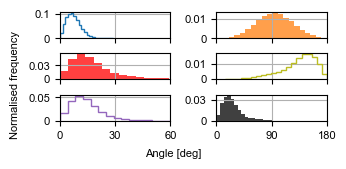

In [38]:

from matplotlib.ticker import FuncFormatter

fs = 8 

# Custom y-tick formatter: round to 2 decimals and strip trailing zeros/dot
def fmt_ytick(y, pos):
    s = f"{y:.2f}"                 # at most two visible decimals
    s = s.rstrip('0').rstrip('.')  # strip trailing zeros and any dangling dot
    return s

ytick_formatter = FuncFormatter(fmt_ytick)

datasets = {
    "Arm axis angle":        (values_angle_arm_axis_target,      "tab:blue",   "step", 1.00),
    "Link angle":            (values_angle_link_target,          "red",        "bar",  0.75),
    "HP link angle":         (values_angle_link_HP_target,       "tab:purple", "step", 1.00),
    "Base angle":            (values_angle_base_target,          "tab:orange", "bar",  0.75),
    "Opposing arm angle":    (values_angle_oppa_target,          "tab:olive",  "step", 1.00),
    "Bound angle":           (values_angle_ds_fused_link_target, "black",      "bar",  0.75),
}

# Layout mapping: (row, col)
# Left column: Arm axis, Link, HP link
# Right column: Base, Opposing arm, Bound
layout_order = [
    ("Arm axis angle",      0, 0),
    ("Base angle",          0, 1),
    ("Link angle",          1, 0),
    ("Opposing arm angle",  1, 1),
    ("HP link angle",       2, 0),
    ("Bound angle",         2, 1),
]

# Figure size (twice as wide as original (3.5/2.54, 3.5/2.54))
width_in  = (8.5/2.54) #2 * (3.5/2.54)
height_in =  (4/2.54)#    (3.5/2.54)

fig, axes = plt.subplots(
    nrows=3, ncols=2,
    figsize=(width_in, height_in),
    sharex='col',                 # share x within each column
    constrained_layout=True
)
axes = np.asarray(axes)


for name, r, c in layout_order:
    vals, color, htype, alpha = datasets[name]
    vals_deg = np.asarray(vals) * 180/np.pi
    ax = axes[r, c]

    hist_kwargs = dict(density=True, bins=20, color=color, label=name)
    if htype == "step":
        ax.hist(vals_deg, histtype="step", **hist_kwargs)
    else:
        ax.hist(vals_deg, histtype="bar", alpha=alpha, **hist_kwargs)

    # Per-subplot legend
    #ax.legend(loc="upper right", frameon=False,
        #      prop={'family': 'Arial', 'size': fs-1})

    # Grid and y-tick formatter
    ax.grid(True)
    ax.yaxis.set_major_formatter(ytick_formatter)

    # Tick font sizes & family
    ax.tick_params(labelsize=fs)
    for lbl in ax.get_xticklabels() + ax.get_yticklabels():
        lbl.set_fontname("Arial")

    # If axis labels are added later, enforce fs
    if ax.get_xlabel():
        ax.set_xlabel(ax.get_xlabel(), fontsize=fs, fontname="Arial")
    if ax.get_ylabel():
        ax.set_ylabel(ax.get_ylabel(), fontsize=fs, fontname="Arial")

# --- Column-specific x ticks and limits ---
# Left column: [0, 30, 60] with xlim(0, 60)
for r in range(3):
    axes[r, 0].set_xticks([0, 30, 60])
    axes[r, 0].set_xlim(0, 60)

# Right column: [0, 90, 180] with xlim(0, 180)
for r in range(3):
    axes[r, 1].set_xticks([0, 90, 180])
    axes[r, 1].set_xlim(0, 180)

# Shared labels (fs enforced)
fig.supxlabel("Angle [deg]", fontsize=fs, fontname="Arial")
fig.supylabel("Normalised frequency", fontsize=fs, fontname="Arial")

#plt.show()
#plt.savefig("ML_parameter_opt_1/NCG_X_motif_conrad_1/figures/target_angles_2.pdf",format="pdf",bbox_inches="tight")


# Combined optimization

In [16]:
#use botorch implementation 
#initialize GP model, train on input and predict next params
def apply_gp_bo_1(x_rs,x_train_rs,x,f_train_rs,seed,dim_x,dim_y,num_restarts,raw_samples,scaler_x):
    #x_rs: full rescaled parameter space  -> no actual rescaling needed with internal rescaling by botorch
    #x_train_rs: rescaled training values -> no actual rescaling needed with internal rescaling by botorch
    #x: full non-rescaled parameter space -> only needed to get bounds
    #initialize and train GP model

    #set random seed for torch and numpy, each round gets different seed based on number of rounds
    torch.manual_seed(seed+len(f_train_rs))
    np.random.seed(seed+len(f_train_rs))

    #fit scaler on full range of values
    scaler_x1=scaler_x()
    scaler_x1.fit(x) 
    x=scaler_x1.transform(x)
    #print(x)
    #minimum and maximum values for bounds
    min_bounds = np.min(x, axis=0)
    max_bounds = np.max(x, axis=0)
    bounds = np.vstack((min_bounds, max_bounds))
    #print(bounds)
    bounds = torch.from_numpy(bounds)
    #print(x_train_rs,f_train_rs)

    #x and f as arrays
    x_train_rs=np.array(x_train_rs)
    f_train_rs=np.array(f_train_rs).reshape(-1,1)

    #option to scale input before botorch 
    x_train_rs=scaler_x1.transform(x_train_rs)
    #print(x_train_rs,f_train_rs)

    #x and f as torch tensor
    x_train_rs=torch.from_numpy(x_train_rs)
    f_train_rs=torch.from_numpy(f_train_rs)
    
    #print(x_train_rs.shape,f_train_rs.shape)
    #option to specify noise
    #train_fvar = torch.zeros_like(f_train_rs)  # Zero noise
    #likelihood = FixedNoiseGaussianLikelihood(noise=train_fvar)
    #gp=SingleTaskGP(train_X=x_train_rs,train_Y=f_train_rs,**params_SingleTaskGP_dict)
    gp=SingleTaskGP(train_X=x_train_rs,train_Y=f_train_rs,input_transform=Normalize(d=dim_x),outcome_transform=Standardize(m=dim_y))
    

    mll = ExactMarginalLogLikelihood(gp.likelihood, gp)
    fit_gpytorch_mll(mll)

    logEI = LogExpectedImprovement(model=gp, best_f=f_train_rs.max())
    #ei = ExpectedImprovement(model=gp, best_f=f_train_rs.max())
    ucb =UpperConfidenceBound(gp, beta=1)

    candidate, acq_value = optimize_acqf(ucb, bounds=bounds, q=1, num_restarts=num_restarts, raw_samples=raw_samples)

    x_rs_next=candidate.detach().numpy()[0]
    #print(x_rs_next)
    #apply inverse scaling transform
    if dim_x==1:
        x_next=scaler_x1.inverse_transform(x_rs_next.reshape(-1, 1)).flatten()
    else:
        x_next=scaler_x1.inverse_transform(x_rs_next)
    #x_next=x_rs_next
    print(x_rs_next,x_next)
    gpr=None
    
    return x_next, x_next, gpr




In [17]:
#for GP parameter values need to be in other range, for instance [0,5], apply scaler to parameter lists
def rescaled_params_df(df):
    scalers = []
    scaled_values = []

    for values in df['Param values']:
        scaler = MinMaxScaler(feature_range=(0, 5))
        scaled = scaler.fit_transform(np.asarray(values*10**20).reshape(-1, 1)).flatten()
        scalers.append(scaler)
        scaled_values.append(scaled)

    df['Scalers'] = scalers
    df['Rs param values'] = scaled_values
    
    return df

#generate linearly scaled rs values, independent of actual parameter scaling
def rescaled_params_2_df(df):
    scalers = []
    scaled_values = []

    for values in df['Param values']:
        scaler = MinMaxScaler(feature_range=(0, 5))
        values_lin=np.linspace(0,5,len(values))
        scaled = scaler.fit_transform(values_lin.reshape(-1, 1)).flatten()
        scalers.append(scaler)
        scaled_values.append(scaled)

    df['Scalers'] = scalers
    df['Rs param values'] = scaled_values
    
    return df

#place holder rescaling
def rescaled_params_no_sc_df(df):
    scalers = []
    scaled_values = []

    for values in df['Param values']:
        scaler = FunctionTransformer(func=None) #MinMaxScaler(feature_range=(0, 5))
        scaled = scaler.fit_transform(np.asarray(values).reshape(-1, 1)).flatten()
        scalers.append(scaler)
        scaled_values.append(scaled)

    df['Scalers'] = scalers
    df['Rs param values'] = scaled_values
    
    return df


def scale_by_inverse_min(X):
    min_vals = np.min(X, axis=0)
    return X * (1 / min_vals)

#sklearn scaler struggles with small values, use simple implementaion generated with Copilot
class MinMaxScaler2:
    def __init__(self):
        self.data_min = None
        self.data_max = None

    def fit(self, data):
        """
        Compute the minimum and maximum values for scaling.

        Parameters:
        data (numpy.ndarray): The input data to be scaled.
        """
        self.data_min = np.min(data, axis=0)
        self.data_max = np.max(data, axis=0)

    def transform(self, data):
        """
        Scale the data to the range [0, 1].

        Parameters:
        data (numpy.ndarray): The input data to be scaled.

        Returns:
        numpy.ndarray: The scaled data.
        """
        if self.data_min is None or self.data_max is None:
            raise ValueError("The scaler has not been fitted yet.")
        scaled_data = (data - self.data_min) / (self.data_max - self.data_min)
        return scaled_data

    def inverse_transform(self, scaled_data):
        """
        Reverse the scaling of the data.

        Parameters:
        scaled_data (numpy.ndarray): The scaled data to be reverted.

        Returns:
        numpy.ndarray: The original data.
        """
        if self.data_min is None or self.data_max is None:
            raise ValueError("The scaler has not been fitted yet.")
        original_data = scaled_data * (self.data_max - self.data_min) + self.data_min
        return original_data
        
#apply MinMaxScaler2 to data
def rescaled_params_df_MinMaxScaler2(df):
    scalers = []
    scaled_values = []

    for values in df['Param values']:
        scaler = MinMaxScaler2()
        scaler.fit(np.asarray(values).reshape(-1, 1))
        scaled = scaler.transform(np.asarray(values).reshape(-1, 1)).flatten()
        scalers.append(scaler)
        scaled_values.append(scaled)

    df['Scalers'] = scalers
    df['Rs param values'] = scaled_values
    
    return df

## Carry out combined optimization in one cell

In [20]:
%%capture 



for i in [0]: #[2,3,4,5,6,7,8,9,10,11,12]
    folder_n="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/opt_v2/"
    
    
    sel_val_target=i
 
    

    ##################################################
    ##################################################
    ############### aa ba oa la angle ###################
    ##################################################
    ##################################################

    #for 5D problem, do initial simulations at edges of 5D-hypercube
    # Edge length
    edge_length = 3
    
    # Generate all combinations of 0 and 3 for 5 dimensions
    param_combs_5D = list(itertools.product([0, edge_length], repeat=5))
    param_combs_5D=np.array(param_combs_5D)
    
    param_combs_5D=np.transpose(param_combs_5D)
    #add 1D array for 1D Problem
    params_combs_1D = np.array([0]*16 + [3]*16) #.reshape(-1, 1)  # Reshape to column vector
    #print(params_combs_1D)
    #print(param_combs_5D)
    param_combs_5D_1D=np.vstack([param_combs_5D,params_combs_1D])
    
    param_combs_5D_1D_list=[]
    for i in range(len(param_combs_5D_1D)):
        param_combs_5D_1D_list_e=[]
        for j in range(len(param_combs_5D_1D[i])):
            param_combs_5D_1D_list_e.append(param_combs_5D_1D[i][j])
        param_combs_5D_1D_list.append(param_combs_5D_1D_list_e)

    #copy of sim params
    run_sim_1_input_2=run_sim_1_input.copy()
    
    #update parameters optimized in previous step
    #run_sim_1_input_2.update(dict_opt_params_step_1)
    
    #specify which parameters are to be optimised over which range
    var_params_2={"Param names":["k_angle_ds_arm",
                              "k_angle_ds_base",
                              "k_angle_ds_oppa",
                              "theta_base_x",
                              "theta_oppa_x",
                            "k_angle_ss_link"],
                             
                "Param values":[k_angle_ds_arm_range,
                               k_angle_ds_base_range,
                               k_angle_ds_oppa_range,
                               theta_base_x_range,
                               theta_oppa_x_range,
                               k_angle_ss_link_range],
                
                "Set of indep params":[0,
                                     0,
                                     0,
                                     0,
                                     0,
                                     1],
               "Index init guess":param_combs_5D_1D_list
               }

    
    df_var_params_2=pd.DataFrame(var_params_2)
    
    
    
    #Std scaler on real values
    #df_var_params_2 = rescaled_params_df(df_var_params_2)
    
    #placeholder scaler on real values
    df_var_params_2 = rescaled_params_no_sc_df(df_var_params_2)

    ###########################
    ###########################

    #specify evaluation and Bayesian opt parameters for each independent set of parameters
    #every independent parameter set needs own dictionaries for GP and eval, as parameters need to be updated independently later
    GP_params_2_0={"x_rs":[[0]],"x_train_rs":[[0]],"x":[[0]],"f_train_rs":[[0]],"seed":1,"dim_x":5,"dim_y":1,"num_restarts":1000,"raw_samples":10000,"scaler_x":MinMaxScaler2}
    GP_params_2_1={"x_rs":[[0]],"x_train_rs":[[0]],"x":[[0]],"f_train_rs":[[0]],"seed":1,"dim_x":1,"dim_y":1,"num_restarts":1000,"raw_samples":10000,"scaler_x":MinMaxScaler2}
    
    
    Eval_params_2_0={"folder":None,"names_sim_repeat":None,"t_skip":300,"t_lim":None,"t_step":1,
                 "arm_axis_angle_distr_target":arm_axis_angle_distr_target,
                 "base_angle_distr_target":base_angle_distr_target,
                 "oppa_angle_distr_target":oppa_angle_distr_target}
    
    Eval_params_2_1={"folder":None,"names_sim_repeat":None,"t_skip":300,"t_lim":None,"t_step":1,
                 "link_angle_distr_target":link_angle_distr_target}
    
    eval_opt_param_set_2={"Set of indep params":[0,
                                                 1],
                          "Eval fct": [eval_sim_c1_3_aa_ba_oa,
                                       eval_sim_c1_1_la],
                          "Eval params":[Eval_params_2_0,
                                         Eval_params_2_1],
                          "Scaler": [FunctionTransformer(func=None),
                                     FunctionTransformer(func=None)],
                          "GP": [apply_gp_bo_1,
                                 apply_gp_bo_1],
                          "GP params": [GP_params_2_0,
                                        GP_params_2_1]}
    
    df_eval_opt_param_set_2=pd.DataFrame(eval_opt_param_set_2)

    ##########################
    ##########################

    #run optimization
    df_t2,gpr_2=run_gp_11(df_run_sim=run_sim_1_input_2,
                  df_var_params=df_var_params_2,
                  fct_sim=run_sim_3,
                  df_eval_opt_param_set=df_eval_opt_param_set_2,
                  sim_folder=folder_n+"aa_ba_oa_la_opt_1/",
                  sim_name="sim_aa_ba_oa_la_opt_1_",
                  file_name_sim_params="params_aa_ba_oa_la_opt_1", #None, #"params_ba_oa_la_opt_1", 
                  sim_repeats=5,
                  iterations=120,
                  print_sim_config=False,
                  load_existing_init_sims=False,
                  load_existing_opt_sims=False)

    ##########################
    ##########################

    #create dictionary with updated parameters
    dict_opt_params_step_2={}
    dict_opt_rs_params_step_2={}
    
    for index, row in df_t2.iterrows():
        id_max=np.argmax(row["f train"])
        print("max fitness:",id_max,np.max(row["f train"]))
        opt_params_names=row["Param names in set"]
        opt_params_names_rs=[ e+"_rs" for e in opt_params_names]
        opt_params=row["x train"][id_max]
        opt_params_rs=row["x train rs"][id_max]
        
        for key, value in zip(opt_params_names,opt_params):
            dict_opt_params_step_2[key] = value
        for key, value in zip(opt_params_names_rs,opt_params_rs):
            dict_opt_rs_params_step_2[key] = value    
            
        #print("param set:",row["Set of indep params"],row["x train rs"][id_max])
        #print("param set:",row["Set of indep params"],row["x train"][id_max])



    ##################################################
    ##################################################
    ################## hp angle ######################
    ##################################################
    ##################################################

    #copy of sim params
    run_sim_1_input_3=run_sim_1_input.copy()
    
    #update parameters optimized in previous step
    #run_sim_1_input_3.update(dict_opt_params_step_1)
    run_sim_1_input_3.update(dict_opt_params_step_2)
    
    #need HP template
    run_sim_1_input_3["use_x_c1_HP_template"]=True
    
    #specify which parameters are to be optimised over which range
    var_params_3={"Param names":["k_angle_ds_hp"],
                             
                "Param values":[k_angle_ds_hp_range],
                
                "Set of indep params":[0],
               "Index init guess":[[0,3]]  #[1,8]
               }
    
    df_var_params_3=pd.DataFrame(var_params_3)
    
    
    #Std scaler on real values
    #df_var_params_3 = rescaled_params_df(df_var_params_3)
    
    #placeholder scaler on real values
    df_var_params_3 = rescaled_params_no_sc_df(df_var_params_3)

    ###############################
    ###############################
    
    #specify evaluation and Bayesian opt parameters for each independent set of parameters
    #every independent parameter set needs own dictionaries for GP and eval, as parameters need to be updated independently later
    GP_params_3={"x_rs":[[0]],"x_train_rs":[[0]],"x":[[0]],"f_train_rs":[[0]],"seed":1,"dim_x":1,"dim_y":1,"num_restarts":100,"raw_samples":1000,"scaler_x":MinMaxScaler2}
    
    
    Eval_params_3={"folder":None,"names_sim_repeat":None,"t_skip":300,"t_lim":None,"t_step":1,
                 "link_HP_angle_distr_target":link_HP_angle_distr_target}
    
    eval_opt_param_set_3={"Set of indep params":[0],
                          "Eval fct": [eval_sim_c1_1_hp],
                          "Eval params":[Eval_params_3],
                          "Scaler": [StandardScaler()],
                          "GP": [apply_gp_bo_1],
                          "GP params": [GP_params_3]}
    
    df_eval_opt_param_set_3=pd.DataFrame(eval_opt_param_set_3)

    ###############################
    ###############################

    #run optimization
    df_t3,gpr_3=run_gp_11(df_run_sim=run_sim_1_input_3,
                  df_var_params=df_var_params_3,
                  fct_sim=run_sim_3,
                  df_eval_opt_param_set=df_eval_opt_param_set_3,
                  sim_folder=folder_n+"hp_opt_1/",
                  sim_name="sim_hp_opt_1_",
                  file_name_sim_params="params_hp_opt_1", #None, #"params_hp_opt_1", 
                  sim_repeats=5,
                  iterations=20,
                  print_sim_config=False,
                  load_existing_init_sims=False,
                  load_existing_opt_sims=False)

    ###############################
    ###############################

    #create dictionary with updated parameters
    dict_opt_params_step_3={}
    dict_opt_rs_params_step_3={}
    
    for index, row in df_t3.iterrows():
        id_max=np.argmax(row["f train"])
        print("max fitness:",id_max,np.max(row["f train"]))
        opt_params_names=row["Param names in set"]
        opt_params_names_rs=[ e+"_rs" for e in opt_params_names]
        opt_params=row["x train"][id_max]
        opt_params_rs=row["x train rs"][id_max]
        
        for key, value in zip(opt_params_names,opt_params):
            dict_opt_params_step_3[key] = value
        for key, value in zip(opt_params_names_rs,opt_params_rs):
            dict_opt_rs_params_step_3[key] = value    
            
        #print("param set:",row["Set of indep params"],row["x train rs"][id_max])
        #print("param set:",row["Set of indep params"],row["x train"][id_max])


    ##################################################
    ##################################################
    ################## bm angle ######################
    ##################################################
    ##################################################

        #copy of sim params
    run_sim_1_input_4=run_sim_1_input.copy()
    
    #update parameters optimized in previous step
    #run_sim_1_input_4.update(dict_opt_params_step_1)
    run_sim_1_input_4.update(dict_opt_params_step_2)
    run_sim_1_input_4.update(dict_opt_params_step_3)
    
    #load state with two fused motifs
    run_sim_1_input_4["checkpoint_path"]="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/two_fused_conrad_x_motifs_checkpoint/"
    
    #specify which parameters are to be optimised over which range
    var_params_4={"Param names":["k_angle_ds_fused_link"],
                             
                "Param values":[k_angle_ds_fused_link_range],
                
                "Set of indep params":[0],
               "Index init guess":[[0,3]] #[1,8]
               }
    
    
    df_var_params_4=pd.DataFrame(var_params_4)
    
    
    #Std scaler on real values
    #df_var_params_4 = rescaled_params_df(df_var_params_4)
    
    #Std scaler on placeholder linearly scaled values
    #df_var_params_4 = rescaled_params_2_df(df_var_params_4)
    
    #placeholder scaler on real values
    df_var_params_4 = rescaled_params_no_sc_df(df_var_params_4)

    #############################
    #############################

    #specify evaluation and Bayesian opt parameters for each independent set of parameters
    #every independent parameter set needs own dictionaries for GP and eval, as parameters need to be updated independently later
    GP_params_4={"x_rs":[[0]],"x_train_rs":[[0]],"x":[[0]],"f_train_rs":[[0]],"seed":1,"dim_x":1,"dim_y":1,"num_restarts":100,"raw_samples":1000,"scaler_x":MinMaxScaler2}
    
    
    Eval_params_4={"folder":None,"names_sim_repeat":None,"t_skip":300,"t_lim":None,"t_step":1,
                 "angle_ds_fused_link_distr_target":angle_ds_fused_link_distr_target}
    
    eval_opt_param_set_4={"Set of indep params":[0],
                          "Eval fct": [eval_sim_c1_1_bm],
                          "Eval params":[Eval_params_4],
                          "Scaler": [StandardScaler()],
                          "GP": [apply_gp_bo_1],
                          "GP params": [GP_params_4]}
    
    df_eval_opt_param_set_4=pd.DataFrame(eval_opt_param_set_4)
    df_eval_opt_param_set_4


    #############################
    #############################

    #run optimization
    df_t4,gpr_4=run_gp_11(df_run_sim=run_sim_1_input_4,
                  df_var_params=df_var_params_4,
                  fct_sim=run_sim_3,
                  df_eval_opt_param_set=df_eval_opt_param_set_4,
                  sim_folder=folder_n+"bm_opt_1/",
                  sim_name="sim_bm_opt_1_",
                  file_name_sim_params="params_bm_opt_1", #None, #"params_bm_opt_1", 
                  sim_repeats=5,
                  iterations=20,
                  print_sim_config=False,
                  load_existing_init_sims=False,
                  load_existing_opt_sims=False)

    #############################
    #############################

    #create dictionary with updated parameters
    dict_opt_params_step_4={}
    dict_opt_rs_params_step_4={}
    
    for index, row in df_t4.iterrows():
        id_max=np.argmax(row["f train"])
        print("max fitness:",id_max,np.max(row["f train"]))
        opt_params_names=row["Param names in set"]
        opt_params_names_rs=[ e+"_rs" for e in opt_params_names]
        opt_params=row["x train"][id_max]
        opt_params_rs=row["x train rs"][id_max]
        
        for key, value in zip(opt_params_names,opt_params):
            dict_opt_params_step_4[key] = value
        for key, value in zip(opt_params_names_rs,opt_params_rs):
            dict_opt_rs_params_step_4[key] = value    
            
        #print("param set:",row["Set of indep params"],row["x train rs"][id_max])
        #print("param set:",row["Set of indep params"],row["x train"][id_max])


    ########################
    ########################

    #create dictionary with all updated parameters
    dict_opt_params_all_steps={}
    dict_opt_rs_params_all_steps={}
    
    #dict_opt_params_all_steps.update(dict_opt_params_step_1)
    dict_opt_params_all_steps.update(dict_opt_params_step_2)
    dict_opt_params_all_steps.update(dict_opt_params_step_3)
    dict_opt_params_all_steps.update(dict_opt_params_step_4)
    
    #dict_opt_rs_params_all_steps.update(dict_opt_rs_params_step_1)
    dict_opt_rs_params_all_steps.update(dict_opt_rs_params_step_2)
    dict_opt_rs_params_all_steps.update(dict_opt_rs_params_step_3)
    dict_opt_rs_params_all_steps.update(dict_opt_rs_params_step_4)

    
    # save optimal paramters 
    save_name_n1=folder_n+'optimal_params_1.pkl'
    with open(save_name_n1, 'wb') as file:
        pickle.dump(dict_opt_params_all_steps, file)
        
    save_name_n2=folder_n+'optimal_rs_params_1.pkl'   
    with open(save_name_n2, 'wb') as file:
        pickle.dump(dict_opt_rs_params_all_steps, file)

    ##################################################
    ##################################################
    ################## opt sim ######################
    ##################################################
    ##################################################

    load_name_n1=folder_n+'optimal_params_1.pkl'
    with open(load_name_n1, 'rb') as file:
        dict_opt_params_all_steps = pickle.load(file)

    #copy of sim params
    run_sim_1_input_opt_1=run_sim_1_input.copy()
    
    #update parameters optimized in previous step
    run_sim_1_input_opt_1.update(dict_opt_params_all_steps)


    run_sim_1_input_opt_1["folder"]=folder_n+"opt_sim_1/"
    run_sim_1_input_opt_1["name"]="x_opt_test_1_"
    run_sim_1_input_opt_1["add_num_1"]=0

    #run multiple copys of sim in parallel
    gen_sim_list=[]
    gen_sim_param_list=[]
    
    for i in range(5):
        gen_sim_list.append(run_sim_3)
        run_sim_1_input_c=run_sim_1_input_opt_1.copy()
        run_sim_1_input_c["add_num_1"]=i
        gen_sim_param_list.append(run_sim_1_input_c)
        
    run_p_dict(gen_sim_list,gen_sim_param_list)

    ######################
    ######################

    #copy of sim params
    run_sim_1_input_opt_2=run_sim_1_input.copy()
    
    #update parameters optimized in previous step
    run_sim_1_input_opt_2.update(dict_opt_params_all_steps)

    run_sim_1_input_opt_2["folder"]=folder_n+"opt_sim_1/"
    run_sim_1_input_opt_2["name"]="x_opt_test_hp_1_"
    run_sim_1_input_opt_2["add_num_1"]=0
    run_sim_1_input_opt_2["use_x_c1_HP_template"]=True
    #run multiple copys of sim in parallel
    gen_sim_list=[]
    gen_sim_param_list=[]
    
    for i in range(5):
        gen_sim_list.append(run_sim_3)
        run_sim_1_input_c=run_sim_1_input_opt_2.copy()
        run_sim_1_input_c["add_num_1"]=i
        gen_sim_param_list.append(run_sim_1_input_c)
        
    run_p_dict(gen_sim_list,gen_sim_param_list)

    ######################
    ######################
    
    #copy of sim params
    run_sim_1_input_opt_3=run_sim_1_input.copy()
    
    #update parameters optimized in previous step
    run_sim_1_input_opt_3.update(dict_opt_params_all_steps)

    run_sim_1_input_opt_3["folder"]=folder_n+"opt_sim_1/"
    run_sim_1_input_opt_3["name"]="x_opt_test_ba_1_"
    run_sim_1_input_opt_3["add_num_1"]=0
    run_sim_1_input_opt_3["checkpoint_path"]="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/two_fused_conrad_x_motifs_checkpoint/"

    #run multiple copys of sim in parallel
    gen_sim_list=[]
    gen_sim_param_list=[]
    
    for i in range(5):
        gen_sim_list.append(run_sim_3)
        run_sim_1_input_c=run_sim_1_input_opt_3.copy()
        run_sim_1_input_c["add_num_1"]=i
        gen_sim_param_list.append(run_sim_1_input_c)
        
    run_p_dict(gen_sim_list,gen_sim_param_list)

In [94]:
%%capture
##################################################
##################################################
################## opt sim ######################
##################################################
##################################################

folder_n="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/"

load_name_n1=folder_n+'optimal_params_1.pkl'
with open(load_name_n1, 'rb') as file:
    dict_opt_params_all_steps = pickle.load(file)

#copy of sim params
run_sim_1_input_opt_1=run_sim_1_input.copy()

#update parameters optimized in previous step
run_sim_1_input_opt_1.update(dict_opt_params_all_steps)


run_sim_1_input_opt_1["folder"]=folder_n+"opt_test_1/"
run_sim_1_input_opt_1["name"]="x_opt_test_1_"
run_sim_1_input_opt_1["add_num_1"]=5

#run multiple copys of sim in parallel
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(10):
    gen_sim_list.append(run_sim_3)
    run_sim_1_input_c=run_sim_1_input_opt_1.copy()
    run_sim_1_input_c["add_num_1"]=i+5
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

######################
######################

#copy of sim params
run_sim_1_input_opt_2=run_sim_1_input.copy()

#update parameters optimized in previous step
run_sim_1_input_opt_2.update(dict_opt_params_all_steps)

run_sim_1_input_opt_2["folder"]=folder_n+"opt_test_1/"
run_sim_1_input_opt_2["name"]="x_opt_test_hp_1_"
run_sim_1_input_opt_2["add_num_1"]=5
run_sim_1_input_opt_2["use_x_c1_HP_template"]=True
#run multiple copys of sim in parallel
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(10):
    gen_sim_list.append(run_sim_3)
    run_sim_1_input_c=run_sim_1_input_opt_2.copy()
    run_sim_1_input_c["add_num_1"]=i+5
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

######################
######################

#copy of sim params
run_sim_1_input_opt_3=run_sim_1_input.copy()

#update parameters optimized in previous step
run_sim_1_input_opt_3.update(dict_opt_params_all_steps)

run_sim_1_input_opt_3["folder"]=folder_n+"opt_test_1/"
run_sim_1_input_opt_3["name"]="x_opt_test_ba_1_"
run_sim_1_input_opt_3["add_num_1"]=5
run_sim_1_input_opt_3["checkpoint_path"]="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/two_fused_conrad_x_motifs_checkpoint/"

#run multiple copys of sim in parallel
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(10):
    gen_sim_list.append(run_sim_3)
    run_sim_1_input_c=run_sim_1_input_opt_3.copy()
    run_sim_1_input_c["add_num_1"]=i+5
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

## Code for split optimization

# Optimize arm axis angle

In [20]:
#copy of sim params
run_sim_1_input_1=run_sim_1_input.copy()

#specify which parameters are to be optimised over which range
var_params_1={"Param names":["k_angle_ds_arm"],
                         
            "Param values":[k_angle_ds_arm_range],
            
            "Set of indep params":[0],
           "Index init guess":[[0,3]] #[1,8]
           }

df_var_params_1=pd.DataFrame(var_params_1)



#placeholder scaler on real values
df_var_params_1 = rescaled_params_no_sc_df(df_var_params_1)


df_var_params_1

,Param names,Param values,Set of indep params,Index init guess,Scalers,Rs param values
0,k_angle_ds_arm,"[1e-24, 1e-22, 1e-20, 1e-18]",0,"[0, 3]",FunctionTransformer(),"[1e-24, 1e-22, 1e-20, 1e-18]"


In [21]:
#specify evaluation and Bayesian opt parameters for each independent set of parameters
#every independent parameter set needs own dictionaries for GP and eval, as parameters need to be updated independently later


GP_params_1={"x_rs":[[0]],"x_train_rs":[[0]],"x":[[0]],"f_train_rs":[[0]],"seed":1,"dim_x":1,"dim_y":1,"num_restarts":100,"raw_samples":1000,"scaler_x":MinMaxScaler2}


Eval_params_1={"folder":None,"names_sim_repeat":None,"t_skip":300,"t_lim":None,"t_step":1,
             "arm_axis_angle_distr_target":arm_axis_angle_distr_target}

eval_opt_param_set_1={"Set of indep params":[0],
                      "Eval fct": [eval_sim_c1_1_aa],
                      "Eval params":[Eval_params_1],
                      "Scaler": [FunctionTransformer(func=None)],
                      "GP": [apply_gp_bo_1],
                      "GP params": [GP_params_1]}

df_eval_opt_param_set_1=pd.DataFrame(eval_opt_param_set_1)
df_eval_opt_param_set_1

,Set of indep params,Eval fct,Eval params,Scaler,GP,GP params
0,0,<function eval_sim_c1_1_aa at 0x7cd9ad188790>,"{'folder': None, 'names_sim_repeat': None, 't_...",FunctionTransformer(),<function apply_gp_bo_1 at 0x7cdadf7799d0>,"{'x_rs': [[0]], 'x_train_rs': [[0]], 'x': [[0]..."


In [22]:
%%time
#run optimization
df_t1,gpr_1=run_gp_11(df_run_sim=run_sim_1_input_1,
              df_var_params=df_var_params_1,
              fct_sim=run_sim_3,
              df_eval_opt_param_set=df_eval_opt_param_set_1,
              sim_folder="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/aa_opt_1/",
              sim_name="sim_aa_opt_1_",
              file_name_sim_params=None, #"params_aa_opt_1", 
              sim_repeats=5,
              iterations=20,
              print_sim_config=False,
              load_existing_init_sims=True,
              load_existing_opt_sims=True)

Step  1 / 2  initial simulations
Step  2 / 2  initial simulations
Step  1 / 20  optimization simulations
[0.69999221] [6.99992513e-19]
Step  2 / 20  optimization simulations
[0.56257699] [5.62577426e-19]
Step  3 / 20  optimization simulations
[0.47454888] [4.74549407e-19]
Step  4 / 20  optimization simulations
[0.39555413] [3.95554733e-19]
Step  5 / 20  optimization simulations
[0.32714585] [3.27146526e-19]
Step  6 / 20  optimization simulations
[0.27000156] [2.70002294e-19]
Step  7 / 20  optimization simulations
[0.22526886] [2.2526963e-19]
Step  8 / 20  optimization simulations
[0.18983473] [1.89835542e-19]
Step  9 / 20  optimization simulations
[0.18743037] [1.87431183e-19]
Step  10 / 20  optimization simulations
[0.19833079] [1.98331594e-19]
Step  11 / 20  optimization simulations
[0.20054154] [2.00542343e-19]
Step  12 / 20  optimization simulations
[0.19253063] [1.92531439e-19]
Step  13 / 20  optimization simulations
[0.20329171] [2.03292505e-19]
Step  14 / 20  optimization simula

In [23]:
df_t1

,Set of indep params,Eval fct,Eval params,Scaler,GP,GP params,Param names in set,f train,f train rs,x train rs,x train
0,0,<function eval_sim_c1_1_aa at 0x7cd9ad188790>,{'folder': '/home/aaron/phd/Nanomotif_Coarse_G...,FunctionTransformer(),<function apply_gp_bo_1 at 0x7cdadf7799d0>,"{'x_rs': [[1e-24], [1e-22], [1e-20], [1e-18]],...",[k_angle_ds_arm],"[0.3490497419318843, 0.5122191409768801, 0.559...","[0.3490497419318843, 0.5122191409768801, 0.559...","[[1e-24], [1e-18], [6.999925127329373e-19], [5...","[[1e-24], [1e-18], [6.999925127329373e-19], [5..."


In [24]:
#create dictionary with updated parameters
dict_opt_params_step_1={}
dict_opt_rs_params_step_1={}

for index, row in df_t1.iterrows():
    id_max=np.argmax(row["f train"])
    print("max fitness:",id_max,np.max(row["f train"]))
    opt_params_names=row["Param names in set"]
    opt_params_names_rs=[ e+"_rs" for e in opt_params_names]
    opt_params=row["x train"][id_max]
    opt_params_rs=row["x train rs"][id_max]
    
    for key, value in zip(opt_params_names,opt_params):
        dict_opt_params_step_1[key] = value
    for key, value in zip(opt_params_names_rs,opt_params_rs):
        dict_opt_rs_params_step_1[key] = value    
        
    print("param set:",row["Set of indep params"],row["x train rs"][id_max])
    print("param set:",row["Set of indep params"],row["x train"][id_max])

    
print(dict_opt_rs_params_step_1)    
print(dict_opt_params_step_1)

max fitness: 14 0.9877236183682916
param set: 0 [2.0329250519203717e-19]
param set: 0 [2.0329250519203717e-19]
{'k_angle_ds_arm_rs': 2.0329250519203717e-19}
{'k_angle_ds_arm': 2.0329250519203717e-19}


Parameter set 0


<Figure size 600x300 with 0 Axes>

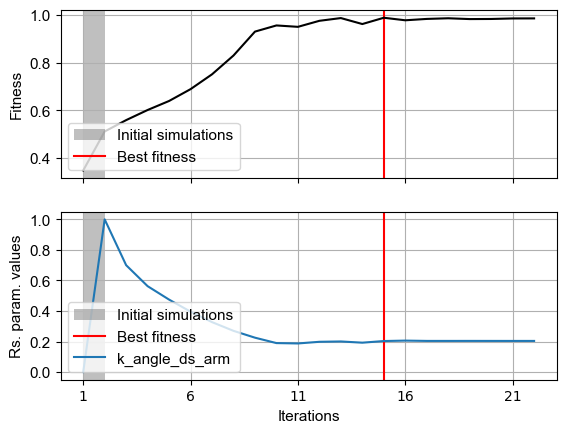

In [25]:
for index, row in df_t1.iterrows():
    fig1=plt.figure(figsize=(6,3))
    fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True)
    #ax1 = fig1.add_subplot(111)
    fitness_range_l=0.4
    fitness_range_h=1
    fitness_range_step=4
    iterations_step=5
    init_sim_range=2
    
    param_set=row["Set of indep params"]
    param_set_name="Parameter set "+str(param_set)
    print(param_set_name)
    iterations_l=np.arange(1,len(row["f train"])+1)
    param_value_range=(0.0,0.2,0.4,0.6,0.8,1.0) #(10**-22,2.5*10**-19,5*10**-19,7.5*10**-19,10**-18)  #=np.linspace(10**-22, 10**-18,5)  #np.arange(0,6,1) 
    fitnes_range=np.linspace(fitness_range_l,fitness_range_h,fitness_range_step)
    ax1.errorbar(iterations_l,row["f train"],color="black")
    id_max_fitnes=np.argmax(row["f train"])
    
    ax1.axvspan(1, init_sim_range, facecolor='grey', alpha=0.5,label="Initial simulations")
    ax1.axvline(iterations_l[id_max_fitnes],color="red",label="Best fitness")
    ax1.set_ylabel("Fitness",fontname = "Arial",fontsize=11)
    #ax1.set_xlabel("Iterations",fontname = "Arial",fontsize=11)
    ax1.set_xticks(iterations_l[::iterations_step],iterations_l[::iterations_step],fontname = "Arial",fontsize=11)
    ax1.set_yticks(fitnes_range,fitnes_range ,fontname= "Arial",fontsize=11)
    ax1.legend(loc="lower left",prop={'family': 'Arial','size': 11})
    ax1.grid()
    
    
    #for j in range(len(row["x train"][0])):
      #  param_name=row["Param names in set"][j]
       # ax2.errorbar(iterations_l,[sublist[j] for sublist in row["x train"]],label=param_name)
    for j in range(len(row["x train rs"][0])):
        param_name=row["Param names in set"][j]
        param_sel=[sublist[j] for sublist in row["x train rs"]]
        scaler_param_sel=MinMaxScaler2()
        param_sel_range=df_var_params_1[df_var_params_1["Param names"]==param_name]["Param values"].to_numpy()[0]
        scaler_param_sel.fit(param_sel_range)
        param_sel_rs=scaler_param_sel.transform(param_sel)
        ax2.errorbar(iterations_l,param_sel_rs,label=param_name)
        
    ax2.axvspan(1, init_sim_range, facecolor='grey', alpha=0.5,label="Initial simulations")
    ax2.axvline(iterations_l[id_max_fitnes],color="red",label="Best fitness")
    ax2.set_xlabel("Iterations",fontname = "Arial",fontsize=11)
    ax2.set_ylabel("Rs. param. values",fontname = "Arial",fontsize=11)
    ax2.set_yticks(param_value_range,param_value_range,fontname = "Arial",fontsize=11)
    #ax2.yaxis.set_major_formatter(matplotlib.ticker.FormatStrFormatter('%.1f'))
    ax2.legend(loc="lower left",prop={'family': 'Arial','size': 11})
    ax2.grid()
    plt.show()

Base angle


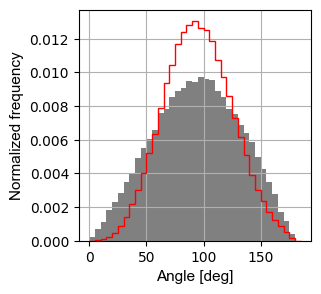

Link angle


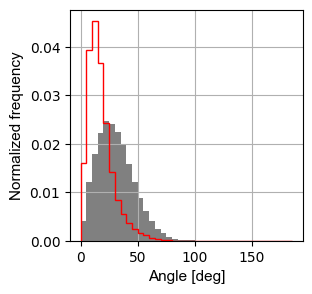

Arm axis angle


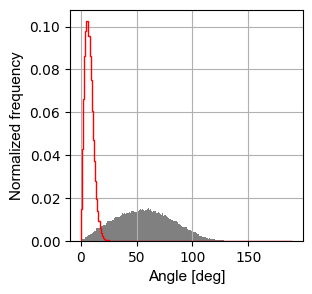

Opposing arm angle


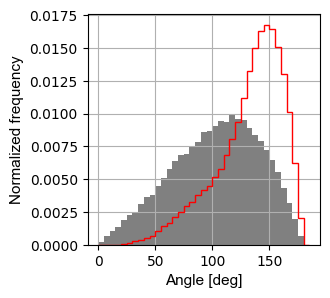

###########################
###########################
###########################
Base angle


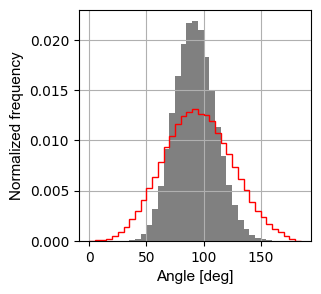

Link angle


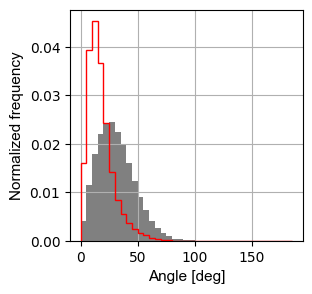

Arm axis angle


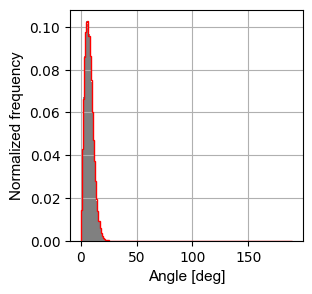

Opposing arm angle


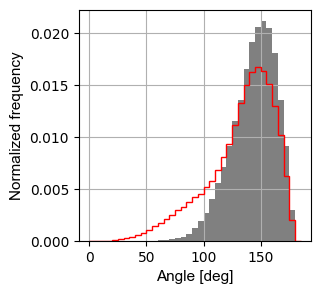

###########################
###########################
###########################
CPU times: user 2 s, sys: 3.71 s, total: 5.71 s
Wall time: 2.96 s


In [26]:
%%time

folder_names_angle_eval="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/aa_opt_1/"

names_ini1="sim_aa_opt_1_"
names_angle_eval=[[names_ini1+str(l+1)+".h5" for l in range(5)],[names_ini1+str(l+71)+".h5" for l in range(5)]]

names_angles=["Base angle", "Link angle","Arm axis angle","Opposing arm angle"]
for i in range(len(names_angle_eval)):
    n1,n2,n3,n4,values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1,values_angle_oppa_ex_test_1=cg_angle_distr_c1_4_ba_aa_oa_la(folder=folder_names_angle_eval,names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)
    list_angles_eval=[values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1,values_angle_oppa_ex_test_1]
    
    for j in range(len(list_angles_eval)):
        fig1=plt.figure(figsize=(3,3))
        ax1 = fig1.add_subplot(111)
        if names_angles[j]=="Arm axis angle":
            sel_target_angle_distr=ax1.hist(list_values_target_angles_1[j]*180/np.pi,bins=np.arange(0,190,1),density=True, histtype='step',ls="-",color="red")[0]
            sel_angle_distr=ax1.hist(list_angles_eval[j]*180/np.pi,bins=np.arange(0,190,1),density=True, histtype='bar',color="grey")[0]
            #plt.xlim(-1,20)
        else:
            sel_target_angle_distr=ax1.hist(list_values_target_angles_1[j]*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='step',ls="-",color="red")[0]
            sel_angle_distr=ax1.hist(list_angles_eval[j]*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='bar',color="grey")[0]
        print(names_angles[j])
        ax1.set_ylabel("Normalized frequency",fontname = "Arial",fontsize=11)
        ax1.set_xlabel("Angle [deg]",fontname = "Arial",fontsize=11)
        ax1.grid()
        plt.show()
    print("###########################")
    print("###########################")
    print("###########################")


# Optimize base angle, oppa angle, sticky end angle

Parameter set 0: k_angle_ds_base,theta_base_x,k_angle_ds_oppa,theta_oppa_x

Parameter set 1: k_angle_ss_link

In [27]:
#copy of sim params
run_sim_1_input_2=run_sim_1_input.copy()

#update parameters optimized in previous step
run_sim_1_input_2.update(dict_opt_params_step_1)

#specify which parameters are to be optimised over which range
var_params_2={"Param names":["k_angle_ds_base",
                          "k_angle_ds_oppa",
                          "k_angle_ss_link",
                          "theta_base_x",
                          "theta_oppa_x"],
                         
            "Param values":[k_angle_ds_base_range,
                           k_angle_ds_oppa_range,
                           k_angle_ss_link_range,
                           theta_base_x_range,
                           theta_oppa_x_range],
            
            "Set of indep params":[0,
                                 0,
                                 1,
                                 0,
                                 0],
           "Index init guess":[[0,0,3,3,0,0,3,3,0,0,3,3,0,0,3,3],
                               [0,3,0,3,0,3,0,3,0,3,0,3,0,3,0,3],
                               [0,3,0,3,0,3,0,3,0,3,0,3,0,3,0,3],
                               [0,0,0,0,3,3,3,3,0,0,0,0,3,3,3,3],
                               [0,0,0,0,0,0,0,0,3,3,3,3,3,3,3,3],
                              ]
           }

'''[1,1,8,8,1,1,8,8,1,1,8,8,1,1,8,8],
                               [1,8,1,8,1,8,1,8,1,8,1,8,1,8,1,8],
                               [1,8,1,8,1,8,1,8,1,8,1,8,1,8,1,8],
                               [1,1,1,1,8,8,8,8,1,1,1,1,8,8,8,8],
                               [1,1,1,1,1,1,1,1,8,8,8,8,8,8,8,8],
                              ]'''

df_var_params_2=pd.DataFrame(var_params_2)



#Std scaler on real values
#df_var_params_2 = rescaled_params_df(df_var_params_2)

#placeholder scaler on real values
df_var_params_2 = rescaled_params_no_sc_df(df_var_params_2)


df_var_params_2

,Param names,Param values,Set of indep params,Index init guess,Scalers,Rs param values
0,k_angle_ds_base,"[1e-24, 1e-22, 1e-20, 1e-18]",0,"[0, 0, 3, 3, 0, 0, 3, 3, 0, 0, 3, 3, 0, 0, 3, 3]",FunctionTransformer(),"[1e-24, 1e-22, 1e-20, 1e-18]"
1,k_angle_ds_oppa,"[1e-24, 1e-22, 1e-20, 1e-18]",0,"[0, 3, 0, 3, 0, 3, 0, 3, 0, 3, 0, 3, 0, 3, 0, 3]",FunctionTransformer(),"[1e-24, 1e-22, 1e-20, 1e-18]"
2,k_angle_ss_link,"[1e-24, 1e-22, 1e-20, 1e-18]",1,"[0, 3, 0, 3, 0, 3, 0, 3, 0, 3, 0, 3, 0, 3, 0, 3]",FunctionTransformer(),"[1e-24, 1e-22, 1e-20, 1e-18]"
3,theta_base_x,"[1.3089969389957472, 1.5707963267948966, 1.832...",0,"[0, 0, 0, 0, 3, 3, 3, 3, 0, 0, 0, 0, 3, 3, 3, 3]",FunctionTransformer(),"[1.3089969389957472, 1.5707963267948966, 1.832..."
4,theta_oppa_x,"[2.356194490192345, 2.6179938779914944, 2.8797...",0,"[0, 0, 0, 0, 0, 0, 0, 0, 3, 3, 3, 3, 3, 3, 3, 3]",FunctionTransformer(),"[2.356194490192345, 2.6179938779914944, 2.8797..."


In [28]:
#specify evaluation and Bayesian opt parameters for each independent set of parameters
#every independent parameter set needs own dictionaries for GP and eval, as parameters need to be updated independently later
GP_params_2_0={"x_rs":[[0]],"x_train_rs":[[0]],"x":[[0]],"f_train_rs":[[0]],"seed":1,"dim_x":4,"dim_y":1,"num_restarts":1000,"raw_samples":10000,"scaler_x":MinMaxScaler2}
GP_params_2_1={"x_rs":[[0]],"x_train_rs":[[0]],"x":[[0]],"f_train_rs":[[0]],"seed":1,"dim_x":1,"dim_y":1,"num_restarts":1000,"raw_samples":10000,"scaler_x":MinMaxScaler2}


Eval_params_2_0={"folder":None,"names_sim_repeat":None,"t_skip":300,"t_lim":None,"t_step":1,
             "base_angle_distr_target":base_angle_distr_target,
             "oppa_angle_distr_target":oppa_angle_distr_target}

Eval_params_2_1={"folder":None,"names_sim_repeat":None,"t_skip":300,"t_lim":None,"t_step":1,
             "link_angle_distr_target":link_angle_distr_target}

eval_opt_param_set_2={"Set of indep params":[0,
                                             1],
                      "Eval fct": [eval_sim_c1_2_ba_oa,
                                   eval_sim_c1_1_la],
                      "Eval params":[Eval_params_2_0,
                                     Eval_params_2_1],
                      "Scaler": [FunctionTransformer(func=None),
                                 FunctionTransformer(func=None)],
                      "GP": [apply_gp_bo_1,
                             apply_gp_bo_1],
                      "GP params": [GP_params_2_0,
                                    GP_params_2_1]}

df_eval_opt_param_set_2=pd.DataFrame(eval_opt_param_set_2)
df_eval_opt_param_set_2

,Set of indep params,Eval fct,Eval params,Scaler,GP,GP params
0,0,<function eval_sim_c1_2_ba_oa at 0x7cd9ad188670>,"{'folder': None, 'names_sim_repeat': None, 't_...",FunctionTransformer(),<function apply_gp_bo_1 at 0x7cdadf7799d0>,"{'x_rs': [[0]], 'x_train_rs': [[0]], 'x': [[0]..."
1,1,<function eval_sim_c1_1_la at 0x7cd9ad188700>,"{'folder': None, 'names_sim_repeat': None, 't_...",FunctionTransformer(),<function apply_gp_bo_1 at 0x7cdadf7799d0>,"{'x_rs': [[0]], 'x_train_rs': [[0]], 'x': [[0]..."


In [29]:
%%time
#run optimization
df_t2,gpr_2=run_gp_11(df_run_sim=run_sim_1_input_2,
              df_var_params=df_var_params_2,
              fct_sim=run_sim_3,
              df_eval_opt_param_set=df_eval_opt_param_set_2,
              sim_folder="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/ba_oa_la_opt_1/",
              sim_name="sim_ba_oa_la_opt_1_",
              file_name_sim_params=None, #"params_ba_oa_la_opt_1", 
              sim_repeats=5,
              iterations=120,
              print_sim_config=False,
              load_existing_init_sims=True,
              load_existing_opt_sims=True)

Step  1 / 16  initial simulations
Step  2 / 16  initial simulations
Step  3 / 16  initial simulations
Step  4 / 16  initial simulations
Step  5 / 16  initial simulations
Step  6 / 16  initial simulations
Step  7 / 16  initial simulations
Step  8 / 16  initial simulations
Step  9 / 16  initial simulations
Step  10 / 16  initial simulations
Step  11 / 16  initial simulations
Step  12 / 16  initial simulations
Step  13 / 16  initial simulations
Step  14 / 16  initial simulations
Step  15 / 16  initial simulations
Step  16 / 16  initial simulations
Step  1 / 120  optimization simulations
[0.         0.         0.34637606 0.60784732] [1.00000000e-24 1.00000000e-24 1.58104006e+00 2.83359666e+00]
[0.72884485] [7.28845122e-19]
Step  2 / 120  optimization simulations
[0.10679589 0.         0.         1.        ] [1.06796779e-19 1.00000000e-24 1.30899694e+00 3.14159265e+00]
[0.57177718] [5.71777609e-19]
Step  3 / 120  optimization simulations
[0.         0.25157333 0.53144711 0.        ] [1.0000

/home/aaron/miniconda3/envs/bayesian_opt_1/lib/python3.9/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(
/home/aaron/miniconda3/envs/bayesian_opt_1/lib/python3.9/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-07 to the diagonal
  warnings.warn(
/home/aaron/miniconda3/envs/bayesian_opt_1/lib/python3.9/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-06 to the diagonal
  warnings.warn(
/home/aaron/miniconda3/envs/bayesian_opt_1/lib/python3.9/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-05 to the diagonal
  warnings.warn(
/home/aaron/miniconda3/envs/bayesian_opt_1/lib/python3.9/site-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-04 to the diagonal
  warnings.warn(
/home/aaron/minicond

[0.         0.00762103 1.         0.51436526] [1.00000000e-24 7.62202602e-21 2.09439510e+00 2.76017602e+00]
[0.04223817] [4.22391258e-20]
Step  63 / 120  optimization simulations
[0.         0.00571303 1.         0.38601189] [1.00000000e-24 5.71401929e-21 2.09439510e+00 2.65936752e+00]
[0.04225449] [4.22554504e-20]
Step  64 / 120  optimization simulations
[0.         0.0062802  1.         0.54903869] [1.00000000e-24 6.28119485e-21 2.09439510e+00 2.78740847e+00]
[0.04226476] [4.22657206e-20]
Step  65 / 120  optimization simulations
[0.         0.00652331 1.         0.57699703] [1.0000000e-24 6.5242986e-21 2.0943951e+00 2.8093669e+00]
[0.04227284] [4.22737963e-20]
Step  66 / 120  optimization simulations
[0.         0.00638723 1.         0.57073089] [1.00000000e-24 6.38822190e-21 2.09439510e+00 2.80444549e+00]
[0.04229648] [4.22974387e-20]
Step  67 / 120  optimization simulations
[0.         0.00638386 1.         0.58048697] [1.00000000e-24 6.38485058e-21 2.09439510e+00 2.81210789e+00]
[

In [30]:
df_t2

,Set of indep params,Eval fct,Eval params,Scaler,GP,GP params,Param names in set,f train,f train rs,x train rs,x train
0,0,<function eval_sim_c1_2_ba_oa at 0x7cd9ad188670>,{'folder': '/home/aaron/phd/Nanomotif_Coarse_G...,FunctionTransformer(),<function apply_gp_bo_1 at 0x7cdadf7799d0>,"{'x_rs': [[1e-24, 1e-24, 1.3089969389957472, 2...","[k_angle_ds_base, k_angle_ds_oppa, theta_base_...","[0.8240677670889217, 0.7949972908094901, 0.728...","[0.8240677670889217, 0.7949972908094901, 0.728...","[[1e-24, 1e-24, 1.3089969389957472, 2.35619449...","[[1e-24, 1e-24, 1.3089969389957472, 2.35619449..."
1,1,<function eval_sim_c1_1_la at 0x7cd9ad188700>,{'folder': '/home/aaron/phd/Nanomotif_Coarse_G...,FunctionTransformer(),<function apply_gp_bo_1 at 0x7cdadf7799d0>,"{'x_rs': [[1e-24], [1e-22], [1e-20], [1e-18]],...",[k_angle_ss_link],"[0.7633199461464817, 0.776890950118566, 0.7624...","[0.7633199461464817, 0.776890950118566, 0.7624...","[[1e-24], [1e-18], [1e-24], [1e-18], [1e-24], ...","[[1e-24], [1e-18], [1e-24], [1e-18], [1e-24], ..."


In [31]:
#create dictionary with updated parameters
dict_opt_params_step_2={}
dict_opt_rs_params_step_2={}

for index, row in df_t2.iterrows():
    id_max=np.argmax(row["f train"])
    print("max fitness:",id_max,np.max(row["f train"]))
    opt_params_names=row["Param names in set"]
    opt_params_names_rs=[ e+"_rs" for e in opt_params_names]
    opt_params=row["x train"][id_max]
    opt_params_rs=row["x train rs"][id_max]
    
    for key, value in zip(opt_params_names,opt_params):
        dict_opt_params_step_2[key] = value
    for key, value in zip(opt_params_names_rs,opt_params_rs):
        dict_opt_rs_params_step_2[key] = value    
        
    print("param set:",row["Set of indep params"],row["x train rs"][id_max])
    print("param set:",row["Set of indep params"],row["x train"][id_max])

    
print(dict_opt_rs_params_step_2)    
print(dict_opt_params_step_2)

max fitness: 108 0.9253781995040353
param set: 0 [1e-24, 5.836171548193426e-21, 2.0943951023931953, 2.8710161065649684]
param set: 0 [1e-24, 5.836171548193426e-21, 2.0943951023931953, 2.8710161065649684]
max fitness: 117 0.9749592770661815
param set: 1 [4.230555199652009e-20]
param set: 1 [4.230555199652009e-20]
{'k_angle_ds_base_rs': 1e-24, 'k_angle_ds_oppa_rs': 5.836171548193426e-21, 'theta_base_x_rs': 2.0943951023931953, 'theta_oppa_x_rs': 2.8710161065649684, 'k_angle_ss_link_rs': 4.230555199652009e-20}
{'k_angle_ds_base': 1e-24, 'k_angle_ds_oppa': 5.836171548193426e-21, 'theta_base_x': 2.0943951023931953, 'theta_oppa_x': 2.8710161065649684, 'k_angle_ss_link': 4.230555199652009e-20}


Parameter set 0


<Figure size 600x300 with 0 Axes>

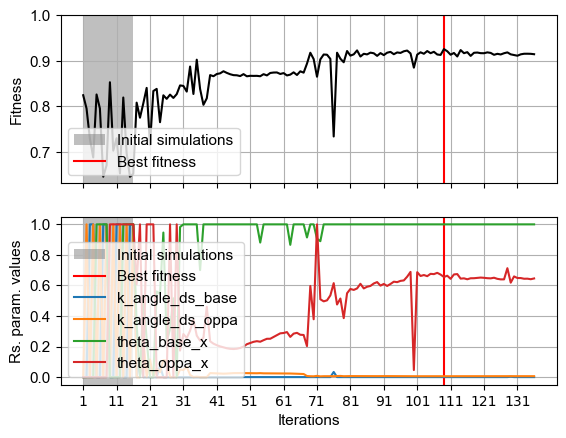

Parameter set 1


<Figure size 600x300 with 0 Axes>

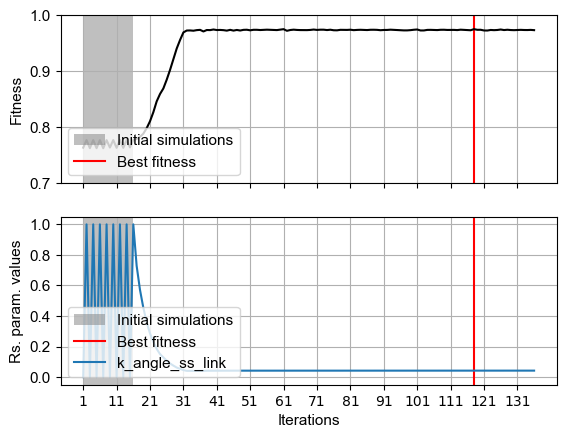

In [51]:
for index, row in df_t2.iterrows():
    fig1=plt.figure(figsize=(6,3))
    fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True)
    #ax1 = fig1.add_subplot(111)
    fitness_range_l=0.7
    fitness_range_h=1
    fitness_range_step=4
    iterations_step=10
    init_sim_range=16
    
    param_set=row["Set of indep params"]
    param_set_name="Parameter set "+str(param_set)
    print(param_set_name)
    iterations_l=np.arange(1,len(row["f train"])+1)
    param_value_range=(0.0,0.2,0.4,0.6,0.8,1.0) #(10**-22,2.5*10**-19,5*10**-19,7.5*10**-19,10**-18)  #=np.linspace(10**-22, 10**-18,5)  #np.arange(0,6,1)
    fitnes_range=np.round(np.linspace(fitness_range_l,fitness_range_h,fitness_range_step),1)
    ax1.errorbar(iterations_l,row["f train"],color="black")
    id_max_fitnes=np.argmax(row["f train"])
    
    ax1.axvspan(1, init_sim_range, facecolor='grey', alpha=0.5,label="Initial simulations")
    ax1.axvline(iterations_l[id_max_fitnes],color="red",label="Best fitness")
    ax1.set_ylabel("Fitness",fontname = "Arial",fontsize=11)
    #ax1.set_xlabel("Iterations",fontname = "Arial",fontsize=11)
    ax1.set_xticks(iterations_l[::iterations_step],iterations_l[::iterations_step],fontname = "Arial",fontsize=11)
    ax1.set_yticks(fitnes_range,fitnes_range ,fontname= "Arial",fontsize=11)
    ax1.legend(loc="lower left",prop={'family': 'Arial','size': 11})
    ax1.grid()
    
    
    #for j in range(len(row["x train rs"][0])):
       # param_name=row["Param names in set"][j]
       # ax2.errorbar(iterations_l,[sublist[j] for sublist in row["x train rs"]],label=param_name)

    for j in range(len(row["x train rs"][0])):
        param_name=row["Param names in set"][j]
        param_sel=[sublist[j] for sublist in row["x train rs"]]
        scaler_param_sel=MinMaxScaler2()
        param_sel_range=df_var_params_2[df_var_params_2["Param names"]==param_name]["Param values"].to_numpy()[0]
        scaler_param_sel.fit(param_sel_range)
        param_sel_rs=scaler_param_sel.transform(param_sel)
        ax2.errorbar(iterations_l,param_sel_rs,label=param_name)
        
    ax2.axvspan(1, init_sim_range, facecolor='grey', alpha=0.5,label="Initial simulations")
    ax2.axvline(iterations_l[id_max_fitnes],color="red",label="Best fitness")
    ax2.set_xlabel("Iterations",fontname = "Arial",fontsize=11)
    ax2.set_ylabel("Rs. param. values",fontname = "Arial",fontsize=11)
    #plt.ylim(10**-22,0.1*10**-18)
    ax2.set_yticks(param_value_range,param_value_range,fontname = "Arial",fontsize=11)
    #ax2.yaxis.set_major_formatter(matplotlib.ticker.FormatStrFormatter('%.1f'))
    ax2.legend(loc="lower left",prop={'family': 'Arial','size': 11})
    ax2.grid()
    plt.show()

Base angle


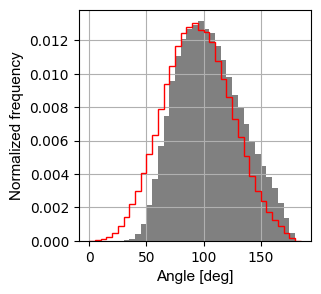

Link angle


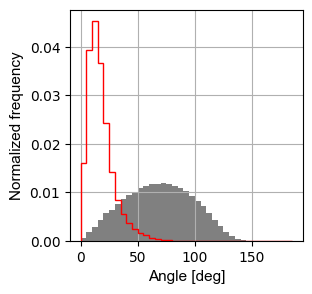

Arm axis angle


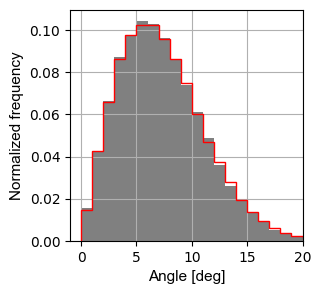

Opposing arm angle


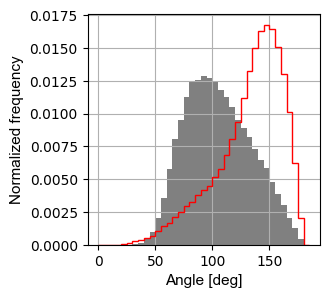

###########################
###########################
###########################
Base angle


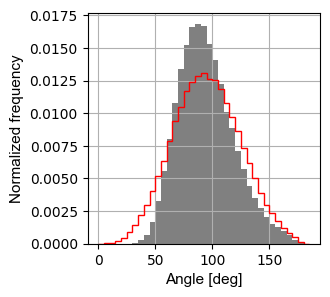

Link angle


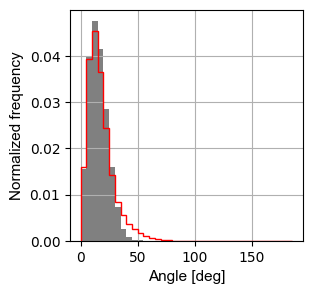

Arm axis angle


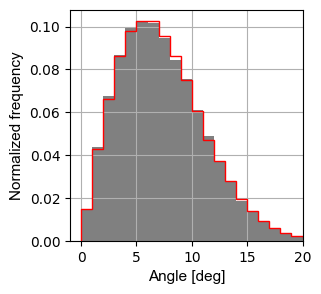

Opposing arm angle


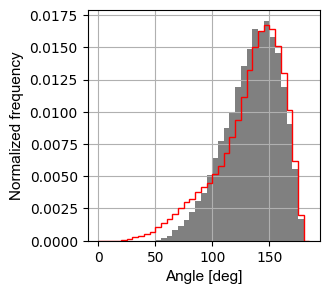

###########################
###########################
###########################
CPU times: user 2.27 s, sys: 3.89 s, total: 6.16 s
Wall time: 3.23 s


In [27]:
%%time

folder_names_angle_eval="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/ba_oa_la_opt_1/"

names_ini1="sim_ba_oa_la_opt_1_"
names_angle_eval=[[names_ini1+str(l+1)+".h5" for l in range(5)],[names_ini1+str(l+541)+".h5" for l in range(5)]] #96

names_angles=["Base angle", "Link angle","Arm axis angle","Opposing arm angle"]
for i in range(len(names_angle_eval)):
    n1,n2,n3,n4,values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1,values_angle_oppa_ex_test_1=cg_angle_distr_c1_4_ba_aa_oa_la(folder=folder_names_angle_eval,names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)
    list_angles_eval=[values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1,values_angle_oppa_ex_test_1]
    
    for j in range(len(list_angles_eval)):
        fig1=plt.figure(figsize=(3,3))
        ax1 = fig1.add_subplot(111)
        if names_angles[j]=="Arm axis angle":
            sel_target_angle_distr=ax1.hist(list_values_target_angles_1[j]*180/np.pi,bins=np.arange(0,190,1),density=True, histtype='step',ls="-",color="red")[0]
            sel_angle_distr=ax1.hist(list_angles_eval[j]*180/np.pi,bins=np.arange(0,190,1),density=True, histtype='bar',color="grey")[0]
            plt.xlim(-1,20)
        else:
            sel_target_angle_distr=ax1.hist(list_values_target_angles_1[j]*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='step',ls="-",color="red")[0]
            sel_angle_distr=ax1.hist(list_angles_eval[j]*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='bar',color="grey")[0]
        print(names_angles[j])
        ax1.set_ylabel("Normalized frequency",fontname = "Arial",fontsize=11)
        ax1.set_xlabel("Angle [deg]",fontname = "Arial",fontsize=11)
        ax1.grid()
        plt.show()
    print("###########################")
    print("###########################")
    print("###########################")


# Optimize HP sticky ends

In [28]:
#copy of sim params
run_sim_1_input_3=run_sim_1_input.copy()

#update parameters optimized in previous step
run_sim_1_input_3.update(dict_opt_params_step_1)
run_sim_1_input_3.update(dict_opt_params_step_2)

#need HP template
run_sim_1_input_3["use_x_c1_HP_template"]=True

#specify which parameters are to be optimised over which range
var_params_3={"Param names":["k_angle_ds_hp"],
                         
            "Param values":[k_angle_ds_hp_range],
            
            "Set of indep params":[0],
           "Index init guess":[[0,3]]  #[1,8]
           }

df_var_params_3=pd.DataFrame(var_params_3)


#Std scaler on real values
#df_var_params_3 = rescaled_params_df(df_var_params_3)

#placeholder scaler on real values
df_var_params_3 = rescaled_params_no_sc_df(df_var_params_3)


df_var_params_3

,Param names,Param values,Set of indep params,Index init guess,Scalers,Rs param values
0,k_angle_ds_hp,"[1e-24, 1e-22, 1e-20, 1e-18]",0,"[0, 3]",FunctionTransformer(),"[1e-24, 1e-22, 1e-20, 1e-18]"


In [29]:
#specify evaluation and Bayesian opt parameters for each independent set of parameters
#every independent parameter set needs own dictionaries for GP and eval, as parameters need to be updated independently later
GP_params_3={"x_rs":[[0]],"x_train_rs":[[0]],"x":[[0]],"f_train_rs":[[0]],"seed":1,"dim_x":1,"dim_y":1,"num_restarts":100,"raw_samples":1000,"scaler_x":MinMaxScaler2}


Eval_params_3={"folder":None,"names_sim_repeat":None,"t_skip":300,"t_lim":None,"t_step":1,
             "link_HP_angle_distr_target":link_HP_angle_distr_target}

eval_opt_param_set_3={"Set of indep params":[0],
                      "Eval fct": [eval_sim_c1_1_hp],
                      "Eval params":[Eval_params_3],
                      "Scaler": [StandardScaler()],
                      "GP": [apply_gp_bo_1],
                      "GP params": [GP_params_3]}

df_eval_opt_param_set_3=pd.DataFrame(eval_opt_param_set_3)
df_eval_opt_param_set_3

,Set of indep params,Eval fct,Eval params,Scaler,GP,GP params
0,0,<function eval_sim_c1_1_hp at 0x7f2625d14820>,"{'folder': None, 'names_sim_repeat': None, 't_...",StandardScaler(),<function apply_gp_bo_1 at 0x7f2625c861f0>,"{'x_rs': [[0]], 'x_train_rs': [[0]], 'x': [[0]..."


In [30]:
#run optimization
df_t3,gpr_3=run_gp_11(df_run_sim=run_sim_1_input_3,
              df_var_params=df_var_params_3,
              fct_sim=run_sim_3,
              df_eval_opt_param_set=df_eval_opt_param_set_3,
              sim_folder="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/hp_opt_1/",
              sim_name="sim_hp_opt_1_",
              file_name_sim_params=None, #"params_hp_opt_1", 
              sim_repeats=5,
              iterations=30,
              print_sim_config=False,
              load_existing_init_sims=True,
              load_existing_opt_sims=True)

Step  1 / 2  initial simulations
Step  2 / 2  initial simulations
Step  1 / 30  optimization simulations
[0.69999222] [6.99992519e-19]
Step  2 / 30  optimization simulations
[0.82961439] [8.29614565e-19]
Step  3 / 30  optimization simulations
[0.59268367] [5.92684079e-19]
Step  4 / 30  optimization simulations
[0.50062408] [5.00624583e-19]
Step  5 / 30  optimization simulations
[0.41987446] [4.19875041e-19]
Step  6 / 30  optimization simulations
[0.34567626] [3.45676912e-19]
Step  7 / 30  optimization simulations
[0.28340785] [2.83408571e-19]
Step  8 / 30  optimization simulations
[0.2369395] [2.36940268e-19]
Step  9 / 30  optimization simulations
[0.20233961] [2.02340407e-19]
Step  10 / 30  optimization simulations
[0.17048035] [1.7048118e-19]
Step  11 / 30  optimization simulations
[0.14730075] [1.47301607e-19]
Step  12 / 30  optimization simulations
[0.12525211] [1.25252985e-19]
Step  13 / 30  optimization simulations
[0.1076111] [1.07611997e-19]
Step  14 / 30  optimization simulati

In [31]:
#create dictionary with updated parameters
dict_opt_params_step_3={}
dict_opt_rs_params_step_3={}

for index, row in df_t3.iterrows():
    id_max=np.argmax(row["f train"])
    print("max fitness:",id_max,np.max(row["f train"]))
    opt_params_names=row["Param names in set"]
    opt_params_names_rs=[ e+"_rs" for e in opt_params_names]
    opt_params=row["x train"][id_max]
    opt_params_rs=row["x train rs"][id_max]
    
    for key, value in zip(opt_params_names,opt_params):
        dict_opt_params_step_3[key] = value
    for key, value in zip(opt_params_names_rs,opt_params_rs):
        dict_opt_rs_params_step_3[key] = value    
        
    print("param set:",row["Set of indep params"],row["x train rs"][id_max])
    print("param set:",row["Set of indep params"],row["x train"][id_max])

    
print(dict_opt_rs_params_step_3)    
print(dict_opt_params_step_3)

max fitness: 30 0.9834732814380496
param set: 0 [5.489465800654975e-20]
param set: 0 [5.489465800654975e-20]
{'k_angle_ds_hp_rs': 5.489465800654975e-20}
{'k_angle_ds_hp': 5.489465800654975e-20}


Parameter set 0


<Figure size 600x300 with 0 Axes>

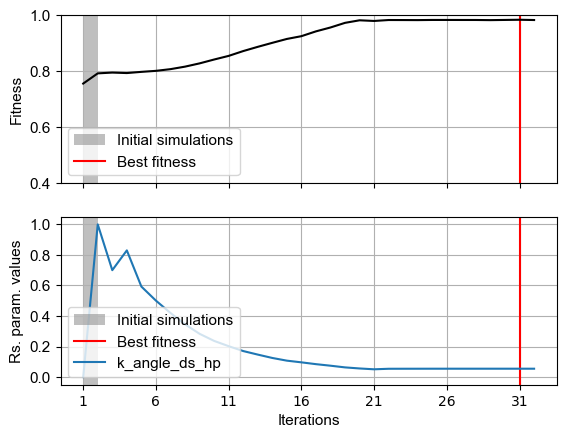

In [32]:
for index, row in df_t3.iterrows():
    fig1=plt.figure(figsize=(6,3))
    fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True)
    #ax1 = fig1.add_subplot(111)
    fitness_range_l=0.4
    fitness_range_h=1
    fitness_range_step=4
    iterations_step=5
    init_sim_range=2
    
    param_set=row["Set of indep params"]
    param_set_name="Parameter set "+str(param_set)
    print(param_set_name)
    iterations_l=np.arange(1,len(row["f train"])+1)
    param_value_range=(0.0,0.2,0.4,0.6,0.8,1.0) #(10**-22,2.5*10**-19,5*10**-19,7.5*10**-19,10**-18)  #=np.linspace(10**-22, 10**-18,5)  #np.arange(0,6,1) 
    fitnes_range=np.linspace(fitness_range_l,fitness_range_h,fitness_range_step)
    ax1.errorbar(iterations_l,row["f train"],color="black")
    id_max_fitnes=np.argmax(row["f train"])
    
    ax1.axvspan(1, init_sim_range, facecolor='grey', alpha=0.5,label="Initial simulations")
    ax1.axvline(iterations_l[id_max_fitnes],color="red",label="Best fitness")
    ax1.set_ylabel("Fitness",fontname = "Arial",fontsize=11)
    #ax1.set_xlabel("Iterations",fontname = "Arial",fontsize=11)
    ax1.set_xticks(iterations_l[::iterations_step],iterations_l[::iterations_step],fontname = "Arial",fontsize=11)
    ax1.set_yticks(fitnes_range,fitnes_range ,fontname= "Arial",fontsize=11)
    ax1.legend(loc="lower left",prop={'family': 'Arial','size': 11})
    ax1.grid()
    
    
    #for j in range(len(row["x train"][0])):
      #  param_name=row["Param names in set"][j]
       # ax2.errorbar(iterations_l,[sublist[j] for sublist in row["x train"]],label=param_name)
    for j in range(len(row["x train rs"][0])):
        param_name=row["Param names in set"][j]
        param_sel=[sublist[j] for sublist in row["x train rs"]]
        scaler_param_sel=MinMaxScaler2()
        param_sel_range=df_var_params_3[df_var_params_3["Param names"]==param_name]["Param values"].to_numpy()[0]
        scaler_param_sel.fit(param_sel_range)
        param_sel_rs=scaler_param_sel.transform(param_sel)
        ax2.errorbar(iterations_l,param_sel_rs,label=param_name)
        
    ax2.axvspan(1, init_sim_range, facecolor='grey', alpha=0.5,label="Initial simulations")
    ax2.axvline(iterations_l[id_max_fitnes],color="red",label="Best fitness")
    ax2.set_xlabel("Iterations",fontname = "Arial",fontsize=11)
    ax2.set_ylabel("Rs. param. values",fontname = "Arial",fontsize=11)
    ax2.set_yticks(param_value_range,param_value_range,fontname = "Arial",fontsize=11)
    #ax2.yaxis.set_major_formatter(matplotlib.ticker.FormatStrFormatter('%.1f'))
    ax2.legend(loc="lower left",prop={'family': 'Arial','size': 11})
    ax2.grid()
    plt.show()

Link HP angle


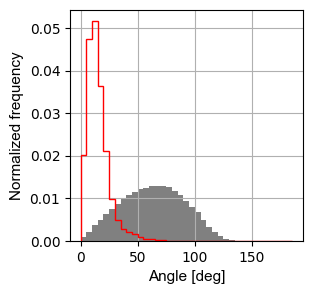

###########################
###########################
###########################
Link HP angle


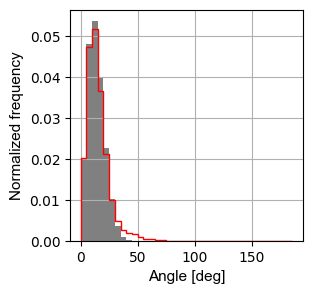

###########################
###########################
###########################
CPU times: user 1.41 s, sys: 2.75 s, total: 4.15 s
Wall time: 2.3 s


In [33]:
%%time

folder_names_angle_eval="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/hp_opt_1/"

names_ini1="sim_hp_opt_1_"
names_angle_eval=[[names_ini1+str(l+1)+".h5" for l in range(5)],[names_ini1+str(l+151)+".h5" for l in range(5)]]

names_angles="Link HP angle"
for i in range(len(names_angle_eval)):
    link_angle_distr_ex_1, values_angle_link_ex1=cg_angle_distr_c1_1_hp(folder=folder_names_angle_eval,names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)
    
    fig1=plt.figure(figsize=(3,3))
    ax1 = fig1.add_subplot(111)

    sel_target_angle_distr=ax1.hist(list_values_target_angles_1[4]*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='step',ls="-",color="red")[0]
    sel_angle_distr=ax1.hist(values_angle_link_ex1*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='bar',color="grey")[0]
    print(names_angles)
    ax1.set_ylabel("Normalized frequency",fontname = "Arial",fontsize=11)
    ax1.set_xlabel("Angle [deg]",fontname = "Arial",fontsize=11)
    ax1.grid()
    plt.show()
    print("###########################")
    print("###########################")
    print("###########################")


# Optimize angle between bound arms

In [34]:
#copy of sim params
run_sim_1_input_4=run_sim_1_input.copy()

#update parameters optimized in previous step
run_sim_1_input_4.update(dict_opt_params_step_1)
run_sim_1_input_4.update(dict_opt_params_step_2)
run_sim_1_input_4.update(dict_opt_params_step_3)

#load state with two fused motifs
run_sim_1_input_4["checkpoint_path"]="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/two_fused_conrad_x_motifs_checkpoint/"

#specify which parameters are to be optimised over which range
var_params_4={"Param names":["k_angle_ds_fused_link"],
                         
            "Param values":[k_angle_ds_fused_link_range],
            
            "Set of indep params":[0],
           "Index init guess":[[0,3]] #[1,8]
           }


df_var_params_4=pd.DataFrame(var_params_4)


#Std scaler on real values
#df_var_params_4 = rescaled_params_df(df_var_params_4)

#Std scaler on placeholder linearly scaled values
#df_var_params_4 = rescaled_params_2_df(df_var_params_4)

#placeholder scaler on real values
df_var_params_4 = rescaled_params_no_sc_df(df_var_params_4)

df_var_params_4

,Param names,Param values,Set of indep params,Index init guess,Scalers,Rs param values
0,k_angle_ds_fused_link,"[1e-24, 1e-22, 1e-20, 1e-18]",0,"[0, 3]",FunctionTransformer(),"[1e-24, 1e-22, 1e-20, 1e-18]"


In [35]:
#specify evaluation and Bayesian opt parameters for each independent set of parameters
#every independent parameter set needs own dictionaries for GP and eval, as parameters need to be updated independently later
GP_params_4={"x_rs":[[0]],"x_train_rs":[[0]],"x":[[0]],"f_train_rs":[[0]],"seed":1,"dim_x":1,"dim_y":1,"num_restarts":100,"raw_samples":1000,"scaler_x":MinMaxScaler2}


Eval_params_4={"folder":None,"names_sim_repeat":None,"t_skip":300,"t_lim":None,"t_step":1,
             "angle_ds_fused_link_distr_target":angle_ds_fused_link_distr_target}

eval_opt_param_set_4={"Set of indep params":[0],
                      "Eval fct": [eval_sim_c1_1_bm],
                      "Eval params":[Eval_params_4],
                      "Scaler": [StandardScaler()],
                      "GP": [apply_gp_bo_1],
                      "GP params": [GP_params_4]}

df_eval_opt_param_set_4=pd.DataFrame(eval_opt_param_set_4)
df_eval_opt_param_set_4

,Set of indep params,Eval fct,Eval params,Scaler,GP,GP params
0,0,<function eval_sim_c1_1_bm at 0x7f2625d148b0>,"{'folder': None, 'names_sim_repeat': None, 't_...",StandardScaler(),<function apply_gp_bo_1 at 0x7f2625c861f0>,"{'x_rs': [[0]], 'x_train_rs': [[0]], 'x': [[0]..."


In [37]:
#run optimization
df_t4,gpr_4=run_gp_11(df_run_sim=run_sim_1_input_4,
              df_var_params=df_var_params_4,
              fct_sim=run_sim_3,
              df_eval_opt_param_set=df_eval_opt_param_set_4,
              sim_folder="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/bm_opt_1/",
              sim_name="sim_bm_opt_1_",
              file_name_sim_params="params_bm_opt_1", #None, #"params_bm_opt_1", 
              sim_repeats=5,
              iterations=30,
              print_sim_config=False,
              load_existing_init_sims=False,
              load_existing_opt_sims=False)

  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

Step  1 / 2  initial simulations


  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

Step  2 / 2  initial simulations


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:38<00:00, 13062.75it/s]


Step  1 / 30  optimization simulations
[0.30000778] [3.00008477e-19]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:37<00:00, 13388.97it/s]


Step  2 / 30  optimization simulations
[0.] [1.e-24]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:39<00:00, 12565.78it/s]


Step  3 / 30  optimization simulations
[0.] [1.e-24]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:41<00:00, 12133.78it/s]


Step  4 / 30  optimization simulations
[0.04028423] [4.02851882e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:41<00:00, 11956.54it/s]


Step  5 / 30  optimization simulations
[0.11191341] [1.11914298e-19]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:39<00:00, 12531.65it/s]

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:40<00:00, 12466.46it/s]


Step  6 / 30  optimization simulations
[0.] [1.e-24]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:40<00:00, 12487.90it/s]


Step  7 / 30  optimization simulations
[0.] [1.e-24]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:40<00:00, 12208.61it/s]


Step  8 / 30  optimization simulations
[0.] [1.e-24]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:38<00:00, 12880.34it/s]


Step  9 / 30  optimization simulations


  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

[0.04531385] [4.53148027e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:40<00:00, 12479.03it/s]

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:40<00:00, 12471.48it/s]


Step  10 / 30  optimization simulations


  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

[0.03907767] [3.90786356e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:43<00:00, 11586.22it/s]


Step  11 / 30  optimization simulations


  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

[0.03636112] [3.63620885e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:41<00:00, 12005.43it/s]


Step  12 / 30  optimization simulations


  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

[0.02621876] [2.62197359e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:41<00:00, 12171.31it/s]


Step  13 / 30  optimization simulations


  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

[0.02178149] [2.17824642e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:40<00:00, 12219.64it/s]


Step  14 / 30  optimization simulations


  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

[0.01985439] [1.98553655e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:41<00:00, 12111.16it/s]


Step  15 / 30  optimization simulations


  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

[0.01730277] [1.73037573e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:41<00:00, 12079.89it/s]


Step  16 / 30  optimization simulations


  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

[0.01645826] [1.64592468e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:41<00:00, 12051.84it/s]


Step  17 / 30  optimization simulations


  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

[0.01580153] [1.58025177e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:43<00:00, 11475.88it/s]


Step  18 / 30  optimization simulations


  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

[0.01604876] [1.60497403e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:41<00:00, 12103.69it/s]


Step  19 / 30  optimization simulations


  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

[0.01571912] [1.57201014e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:42<00:00, 11657.58it/s]


Step  20 / 30  optimization simulations


  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

[0.0153211] [1.53220883e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:42<00:00, 11831.68it/s]


Step  21 / 30  optimization simulations


  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

[0.01582385] [1.58248322e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:42<00:00, 11890.82it/s]


Step  22 / 30  optimization simulations


  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

[0.01560036] [1.56013443e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:41<00:00, 11910.79it/s]


Step  23 / 30  optimization simulations


  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

[0.01417276] [1.41737431e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:39<00:00, 12729.74it/s]

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:39<00:00, 12717.51it/s]


Step  24 / 30  optimization simulations


  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

[0.01718041] [1.71813939e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:39<00:00, 12584.10it/s]


Step  25 / 30  optimization simulations


  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

[0.01682334] [1.68243256e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:40<00:00, 12231.74it/s]


Step  26 / 30  optimization simulations
[0.01679961] [1.68005952e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:43<00:00, 11459.29it/s]


Step  27 / 30  optimization simulations


  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

[0.01685774] [1.68587238e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:43<00:00, 11604.01it/s]


Step  28 / 30  optimization simulations


  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

[0.01712375] [1.71247312e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:42<00:00, 11714.37it/s]


Step  29 / 30  optimization simulations


  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

[0.01677983] [1.67808102e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:42<00:00, 11797.94it/s]


Step  30 / 30  optimization simulations


  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

[0.01677093] [1.67719095e-20]


100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:42<00:00, 11796.81it/s]


In [39]:
#create dictionary with updated parameters
dict_opt_params_step_4={}
dict_opt_rs_params_step_4={}

for index, row in df_t4.iterrows():
    id_max=np.argmax(row["f train"])
    print("max fitness:",id_max,np.max(row["f train"]))
    opt_params_names=row["Param names in set"]
    opt_params_names_rs=[ e+"_rs" for e in opt_params_names]
    opt_params=row["x train"][id_max]
    opt_params_rs=row["x train rs"][id_max]
    
    for key, value in zip(opt_params_names,opt_params):
        dict_opt_params_step_4[key] = value
    for key, value in zip(opt_params_names_rs,opt_params_rs):
        dict_opt_rs_params_step_4[key] = value    
        
    print("param set:",row["Set of indep params"],row["x train rs"][id_max])
    print("param set:",row["Set of indep params"],row["x train"][id_max])

    
print(dict_opt_rs_params_step_4)    
print(dict_opt_params_step_4)

max fitness: 20 0.9746119114738134
param set: 0 [1.572010144863922e-20]
param set: 0 [1.572010144863922e-20]
{'k_angle_ds_fused_link_rs': 1.572010144863922e-20}
{'k_angle_ds_fused_link': 1.572010144863922e-20}


Parameter set 0


<Figure size 600x300 with 0 Axes>

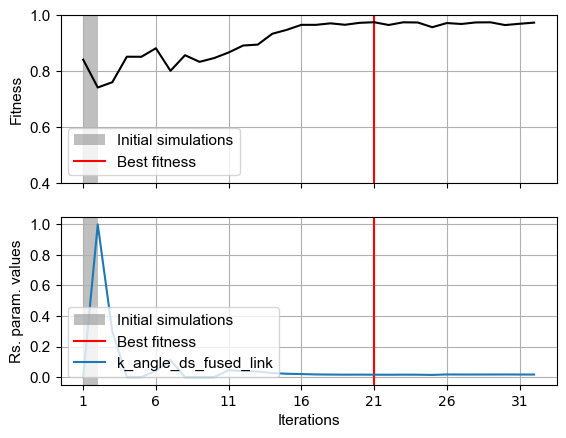

In [40]:
for index, row in df_t4.iterrows():
    fig1=plt.figure(figsize=(6,3))
    fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True)
    #ax1 = fig1.add_subplot(111)
    fitness_range_l=0.4
    fitness_range_h=1
    fitness_range_step=4
    iterations_step=5
    init_sim_range=2
    
    param_set=row["Set of indep params"]
    param_set_name="Parameter set "+str(param_set)
    print(param_set_name)
    iterations_l=np.arange(1,len(row["f train"])+1)
    param_value_range=(0.0,0.2,0.4,0.6,0.8,1.0) #(10**-22,2.5*10**-19,5*10**-19,7.5*10**-19,10**-18)  #=np.linspace(10**-22, 10**-18,5)  #np.arange(0,6,1) 
    fitnes_range=np.linspace(fitness_range_l,fitness_range_h,fitness_range_step)
    ax1.errorbar(iterations_l,row["f train"],color="black")
    id_max_fitnes=np.argmax(row["f train"])
    
    ax1.axvspan(1, init_sim_range, facecolor='grey', alpha=0.5,label="Initial simulations")
    ax1.axvline(iterations_l[id_max_fitnes],color="red",label="Best fitness")
    ax1.set_ylabel("Fitness",fontname = "Arial",fontsize=11)
    #ax1.set_xlabel("Iterations",fontname = "Arial",fontsize=11)
    ax1.set_xticks(iterations_l[::iterations_step],iterations_l[::iterations_step],fontname = "Arial",fontsize=11)
    ax1.set_yticks(fitnes_range,fitnes_range ,fontname= "Arial",fontsize=11)
    ax1.legend(loc="lower left",prop={'family': 'Arial','size': 11})
    ax1.grid()
    
    
    #for j in range(len(row["x train"][0])):
      #  param_name=row["Param names in set"][j]
       # ax2.errorbar(iterations_l,[sublist[j] for sublist in row["x train"]],label=param_name)
    for j in range(len(row["x train rs"][0])):
        param_name=row["Param names in set"][j]
        param_sel=[sublist[j] for sublist in row["x train rs"]]
        scaler_param_sel=MinMaxScaler2()
        param_sel_range=df_var_params_4[df_var_params_4["Param names"]==param_name]["Param values"].to_numpy()[0]
        scaler_param_sel.fit(param_sel_range)
        param_sel_rs=scaler_param_sel.transform(param_sel)
        ax2.errorbar(iterations_l,param_sel_rs,label=param_name)
        
    ax2.axvspan(1, init_sim_range, facecolor='grey', alpha=0.5,label="Initial simulations")
    ax2.axvline(iterations_l[id_max_fitnes],color="red",label="Best fitness")
    ax2.set_xlabel("Iterations",fontname = "Arial",fontsize=11)
    ax2.set_ylabel("Rs. param. values",fontname = "Arial",fontsize=11)
    ax2.set_yticks(param_value_range,param_value_range,fontname = "Arial",fontsize=11)
    #ax2.yaxis.set_major_formatter(matplotlib.ticker.FormatStrFormatter('%.1f'))
    ax2.legend(loc="lower left",prop={'family': 'Arial','size': 11})
    ax2.grid()
    plt.show()

Bound motifs angle


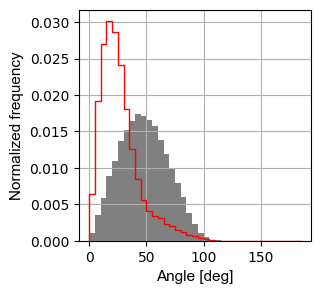

###########################
###########################
###########################
Bound motifs angle


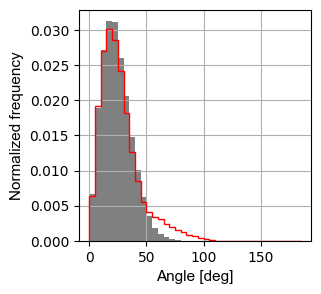

###########################
###########################
###########################
CPU times: user 1.15 s, sys: 2.32 s, total: 3.47 s
Wall time: 814 ms


In [41]:
%%time

folder_names_angle_eval="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/bm_opt_1/"

names_ini1="sim_bm_opt_1_"
names_angle_eval=[[names_ini1+str(l+1)+".h5" for l in range(5)],[names_ini1+str(l+101)+".h5" for l in range(5)]]

names_angles="Bound motifs angle"
for i in range(len(names_angle_eval)):
    angle_ds_fused_link_distr_ex_1, values_angle_ds_fused_link_ex1=cg_angle_distr_c1_1_bm(folder=folder_names_angle_eval,names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)
    
    fig1=plt.figure(figsize=(3,3))
    ax1 = fig1.add_subplot(111)

    sel_target_angle_distr=ax1.hist(list_values_target_angles_1[5]*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='step',ls="-",color="red")[0]
    sel_angle_distr=ax1.hist(values_angle_ds_fused_link_ex1*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='bar',color="grey")[0]
    print(names_angles)
    ax1.set_ylabel("Normalized frequency",fontname = "Arial",fontsize=11)
    ax1.set_xlabel("Angle [deg]",fontname = "Arial",fontsize=11)
    ax1.grid()
    plt.show()
    print("###########################")
    print("###########################")
    print("###########################")


In [42]:
#create dictionary with all updated parameters
dict_opt_params_all_steps={}
dict_opt_rs_params_all_steps={}

dict_opt_params_all_steps.update(dict_opt_params_step_1)
dict_opt_params_all_steps.update(dict_opt_params_step_2)
dict_opt_params_all_steps.update(dict_opt_params_step_3)
dict_opt_params_all_steps.update(dict_opt_params_step_4)

dict_opt_rs_params_all_steps.update(dict_opt_rs_params_step_1)
dict_opt_rs_params_all_steps.update(dict_opt_rs_params_step_2)
dict_opt_rs_params_all_steps.update(dict_opt_rs_params_step_3)
dict_opt_rs_params_all_steps.update(dict_opt_rs_params_step_4)


print(dict_opt_params_all_steps)
print("#############")
print("#############")
print(dict_opt_rs_params_all_steps)

{'k_angle_ds_arm': 2.0329250519203717e-19, 'k_angle_ds_base': 1e-24, 'k_angle_ds_oppa': 5.836171548193426e-21, 'theta_base_x': 2.0943951023931953, 'theta_oppa_x': 2.8710161065649684, 'k_angle_ss_link': 4.230555199652009e-20, 'k_angle_ds_hp': 5.489465800654975e-20, 'k_angle_ds_fused_link': 1.572010144863922e-20}
#############
#############
{'k_angle_ds_arm_rs': 2.0329250519203717e-19, 'k_angle_ds_base_rs': 1e-24, 'k_angle_ds_oppa_rs': 5.836171548193426e-21, 'theta_base_x_rs': 2.0943951023931953, 'theta_oppa_x_rs': 2.8710161065649684, 'k_angle_ss_link_rs': 4.230555199652009e-20, 'k_angle_ds_hp_rs': 5.489465800654975e-20, 'k_angle_ds_fused_link_rs': 1.572010144863922e-20}


In [43]:
# save optimal paramters 

with open('/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/optimal_params_1.pkl', 'wb') as file:
    pickle.dump(dict_opt_params_all_steps, file)
    
with open('/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/optimal_rs_params_1.pkl', 'wb') as file:
    pickle.dump(dict_opt_rs_params_all_steps, file)

# Run simulation with optimized parameters

## base, link, arm axis, oppa arm angles

In [44]:
#copy of sim params
run_sim_1_input_opt_1=run_sim_1_input.copy()

#update parameters optimized in previous step
run_sim_1_input_opt_1.update(dict_opt_params_all_steps)

In [45]:
run_sim_1_input_opt_1["folder"]="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/opt_test_1/"
run_sim_1_input_opt_1["name"]="x_opt_test_1_"
run_sim_1_input_opt_1["add_num_1"]=0

In [46]:
#run multiple copys of sim in parallel
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(5):
    gen_sim_list.append(run_sim_3)
    run_sim_1_input_c=run_sim_1_input_opt_1.copy()
    run_sim_1_input_c["add_num_1"]=i
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

Configured kernel context with:
--------------------------------
 - kBT = 4.0473725435e-21
 - periodic b.c. = (false, false, false)
 - box size = (150, 150, 150)
 - particle types:
     * Topology particle type "x_link_hp_d_c1" with D=0.10097700765460783
     * Topology particle type "x_link_hp_c_c1" with D=0.10097700765460783
     * Topology particle type "x_link_hp_b_c1" with D=0.10097700765460783
     * Topology particle type "x_link_hp_a_c1" with D=0.10097700765460783
     * Topology particle type "x_link_fused_d_c1" with D=0.10097700765460783
     * Topology particle type "x_link_fused_c_c1" with D=0.10097700765460783
     * Topology particle type "x_link_fused_b_c1" with D=0.10097700765460783
     * Topology particle type "x_link_fused_a_c1" with D=0.10097700765460783
     * Topology particle type "x_link_d_c1" with D=0.10097700765460783
     * Topology particle type "x_arm_d_c1" with D=0.10097700765460783
     * Topology particle type "x_base_arm_d_c1" with D=0.10097700765460783

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:17<00:00, 27857.62it/s]


Fitness arm axis: 0.9869803901331414
Fitness base+oppa: 0.9186937461409475
Fitness link: 0.9733824348757845
Base angle


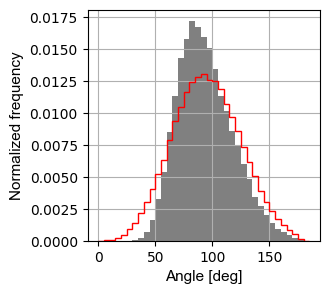

Link angle


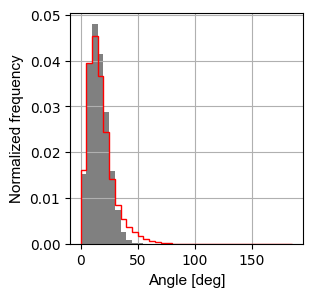

Arm axis angle


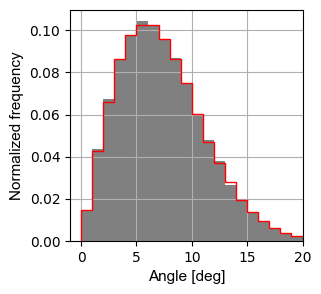

Opposing arm angle


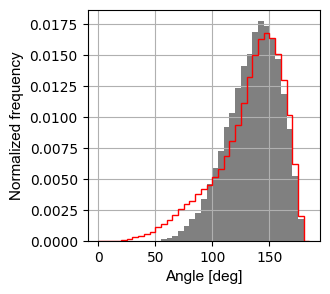

###########################
###########################
###########################
CPU times: user 1.25 s, sys: 1.85 s, total: 3.1 s
Wall time: 1.52 s


In [47]:
%%time

folder_names_angle_eval="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/opt_test_1/"

names_ini1="x_opt_test_1_"
names_angle_eval=[[names_ini1+str(l+0)+".h5" for l in range(5)]] #96

names_angles=["Base angle", "Link angle","Arm axis angle","Opposing arm angle"]
for i in range(len(names_angle_eval)):
    base_angle_distr_ex_1,link_angle_distr_ex_1,arm_axis_angle_distr_ex_1,oppa_angle_distr_ex_1     ,values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1,values_angle_oppa_ex_test_1=cg_angle_distr_c1_4_ba_aa_oa_la(folder=folder_names_angle_eval,names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)
    list_angles_eval=[values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1,values_angle_oppa_ex_test_1]
    
    print("Fitness arm axis:", gt_1_1(arm_axis_angle_distr_ex_1,arm_axis_angle_distr_target))
    print("Fitness base+oppa:", gt_1_2(base_angle_distr_ex_1,oppa_angle_distr_ex_1,base_angle_distr_target,oppa_angle_distr_target))
    print("Fitness link:", gt_1_1(link_angle_distr_ex_1,link_angle_distr_target))
    
    for j in range(len(list_angles_eval)):
        fig1=plt.figure(figsize=(3,3))
        ax1 = fig1.add_subplot(111)
        if names_angles[j]=="Arm axis angle":
            sel_target_angle_distr=ax1.hist(list_values_target_angles_1[j]*180/np.pi,bins=np.arange(0,190,1),density=True, histtype='step',ls="-",color="red")[0]
            sel_angle_distr=ax1.hist(list_angles_eval[j]*180/np.pi,bins=np.arange(0,190,1),density=True, histtype='bar',color="grey")[0]
            plt.xlim(-1,20)
        else:
            sel_target_angle_distr=ax1.hist(list_values_target_angles_1[j]*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='step',ls="-",color="red")[0]
            sel_angle_distr=ax1.hist(list_angles_eval[j]*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='bar',color="grey")[0]
        print(names_angles[j])
        ax1.set_ylabel("Normalized frequency",fontname = "Arial",fontsize=11)
        ax1.set_xlabel("Angle [deg]",fontname = "Arial",fontsize=11)
        ax1.grid()
        plt.show()
    print("###########################")
    print("###########################")
    print("###########################")

## hp angle

In [53]:
#copy of sim params
run_sim_1_input_opt_2=run_sim_1_input.copy()

#update parameters optimized in previous step
run_sim_1_input_opt_2.update(dict_opt_params_all_steps)

In [54]:
run_sim_1_input_opt_2["folder"]="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/opt_test_1/"
run_sim_1_input_opt_2["name"]="x_opt_test_hp_1_"
run_sim_1_input_opt_2["add_num_1"]=0
run_sim_1_input_opt_2["use_x_c1_HP_template"]=True

In [55]:
#run multiple copys of sim in parallel
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(5):
    gen_sim_list.append(run_sim_3)
    run_sim_1_input_c=run_sim_1_input_opt_2.copy()
    run_sim_1_input_c["add_num_1"]=i
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

Configured kernel context with:
--------------------------------
 - kBT = 4.0473725435e-21
 - periodic b.c. = (false, false, false)
 - box size = (150, 150, 150)
 - particle types:
     * Topology particle type "x_link_hp_d_c1" with D=0.10097700765460783
     * Topology particle type "x_link_hp_c_c1" with D=0.10097700765460783
     * Topology particle type "x_link_hp_b_c1" with D=0.10097700765460783
     * Topology particle type "x_link_hp_a_c1" with D=0.10097700765460783
     * Topology particle type "x_link_fused_d_c1" with D=0.10097700765460783
     * Topology particle type "x_link_fused_c_c1" with D=0.10097700765460783
     * Topology particle type "x_link_fused_b_c1" with D=0.10097700765460783
     * Topology particle type "x_link_fused_a_c1" with D=0.10097700765460783
     * Topology particle type "x_link_d_c1" with D=0.10097700765460783
     * Topology particle type "x_arm_d_c1" with D=0.10097700765460783
     * Topology particle type "x_base_arm_d_c1" with D=0.10097700765460783

  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.0473725435e-21
 - periodic b.c. = (false, false, false)
 - box size = (150, 150, 150)
 - particle types:
     * Topology particle type "x_link_hp_d_c1" with D=0.10097700765460783
     * Topology particle type "x_link_hp_c_c1" with D=0.10097700765460783
     * Topology particle type "x_link_hp_b_c1" with D=0.10097700765460783
     * Topology particle type "x_link_hp_a_c1" with D=0.10097700765460783
     * Topology particle type "x_link_fused_d_c1" with D=0.10097700765460783
     * Topology particle type "x_link_fused_c_c1" with D=0.10097700765460783
     * Topology particle type "x_link_fused_b_c1" with D=0.10097700765460783
     * Topology particle type "x_link_fused_a_c1" with D=0.10097700765460783
     * Topology particle type "x_link_d_c1" with D=0.10097700765460783
     * Topology particle type "x_arm_d_c1" with D=0.10097700765460783
     * Topology particle type "x_base_arm_d_c1" with D=0.10097700765460783

  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

Configured kernel context with:
--------------------------------
 - kBT = 4.0473725435e-21
 - periodic b.c. = (false, false, false)
 - box size = (150, 150, 150)
 - particle types:
     * Topology particle type "x_link_hp_d_c1" with D=0.10097700765460783
     * Topology particle type "x_link_hp_c_c1" with D=0.10097700765460783
     * Topology particle type "x_link_hp_b_c1" with D=0.10097700765460783
     * Topology particle type "x_link_hp_a_c1" with D=0.10097700765460783
     * Topology particle type "x_link_fused_d_c1" with D=0.10097700765460783
     * Topology particle type "x_link_fused_c_c1" with D=0.10097700765460783
     * Topology particle type "x_link_fused_b_c1" with D=0.10097700765460783
     * Topology particle type "x_link_fused_a_c1" with D=0.10097700765460783
     * Topology particle type "x_link_d_c1" with D=0.10097700765460783
     * Topology particle type "x_arm_d_c1" with D=0.10097700765460783
     * Topology particle type "x_base_arm_d_c1" with D=0.10097700765460783

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:18<00:00, 26760.43it/s]


Link HP angle
Fitness hp: 0.9831154108007338


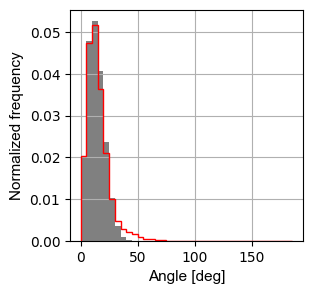

###########################
###########################
###########################
CPU times: user 892 ms, sys: 783 ms, total: 1.68 s
Wall time: 1.49 s


In [56]:
%%time

folder_names_angle_eval="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/opt_test_1/"

names_ini1="x_opt_test_hp_1_"
names_angle_eval=[[names_ini1+str(l+0)+".h5" for l in range(5)]]

names_angles="Link HP angle"
for i in range(len(names_angle_eval)):
    link_angle_distr_ex_1, values_angle_link_ex1=cg_angle_distr_c1_1_hp(folder=folder_names_angle_eval,names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)
    
    fig1=plt.figure(figsize=(3,3))
    ax1 = fig1.add_subplot(111)

    sel_target_angle_distr=ax1.hist(list_values_target_angles_1[4]*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='step',ls="-",color="red")[0]
    sel_angle_distr=ax1.hist(values_angle_link_ex1*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='bar',color="grey")[0]
    print(names_angles)
    print("Fitness hp:",gt_1_1(sel_angle_distr,sel_target_angle_distr))
    ax1.set_ylabel("Normalized frequency",fontname = "Arial",fontsize=11)
    ax1.set_xlabel("Angle [deg]",fontname = "Arial",fontsize=11)
    ax1.grid()
    plt.show()
    print("###########################")
    print("###########################")
    print("###########################")


## bound arm angles

In [57]:
#copy of sim params
run_sim_1_input_opt_3=run_sim_1_input.copy()

#update parameters optimized in previous step
run_sim_1_input_opt_3.update(dict_opt_params_all_steps)

In [58]:
run_sim_1_input_opt_3["folder"]="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/opt_test_1/"
run_sim_1_input_opt_3["name"]="x_opt_test_ba_1_"
run_sim_1_input_opt_3["add_num_1"]=0
run_sim_1_input_opt_3["checkpoint_path"]="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/two_fused_conrad_x_motifs_checkpoint/"


In [59]:
#run multiple copys of sim in parallel
gen_sim_list=[]
gen_sim_param_list=[]

for i in range(5):
    gen_sim_list.append(run_sim_3)
    run_sim_1_input_c=run_sim_1_input_opt_3.copy()
    run_sim_1_input_c["add_num_1"]=i
    gen_sim_param_list.append(run_sim_1_input_c)
    
run_p_dict(gen_sim_list,gen_sim_param_list)

Configured kernel context with:
--------------------------------
 - kBT = 4.0473725435e-21
 - periodic b.c. = (false, false, false)
 - box size = (150, 150, 150)
 - particle types:
     * Topology particle type "x_link_hp_d_c1" with D=0.10097700765460783
     * Topology particle type "x_link_hp_c_c1" with D=0.10097700765460783
     * Topology particle type "x_link_hp_b_c1" with D=0.10097700765460783
     * Topology particle type "x_link_hp_a_c1" with D=0.10097700765460783
     * Topology particle type "x_link_fused_d_c1" with D=0.10097700765460783
     * Topology particle type "x_link_fused_c_c1" with D=0.10097700765460783
     * Topology particle type "x_link_fused_b_c1" with D=0.10097700765460783
     * Topology particle type "x_link_fused_a_c1" with D=0.10097700765460783
     * Topology particle type "x_link_d_c1" with D=0.10097700765460783
     * Topology particle type "x_arm_d_c1" with D=0.10097700765460783
     * Topology particle type "x_base_arm_d_c1" with D=0.10097700765460783

  0%|                                                                                        | 0/500000 [00:00<?, ?it/s]

Configured simulation loop with:
--------------------------------
 - timeStep = 0.01
 - evaluateObservables = true
 - progressOutputStride = 100
 - context written to file = true
 - Performing actions:
   * Initialize neighbor list? true
   * Update neighbor list? true
   * Clear neighbor list? true
   * Integrate diffusion? true
   * Calculate forces? true
   * Handle reactions? true
   * Handle topology reactions? true

Configured kernel context with:
--------------------------------
 - kBT = 4.0473725435e-21
 - periodic b.c. = (false, false, false)
 - box size = (150, 150, 150)
 - particle types:
     * Topology particle type "x_link_hp_d_c1" with D=0.10097700765460783
     * Topology particle type "x_link_hp_c_c1" with D=0.10097700765460783
     * Topology particle type "x_link_hp_b_c1" with D=0.10097700765460783
     * Topology particle type "x_link_hp_a_c1" with D=0.10097700765460783
     * Topology particle type "x_link_fused_d_c1" with D=0.10097700765460783
     * Topology part

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:37<00:00, 13204.87it/s]

100%|████████████████████████████████████████████████████████████████████████| 500000/500000 [00:38<00:00, 12902.06it/s]


Bound motifs angle
Fitness ba: 0.9753476294025151


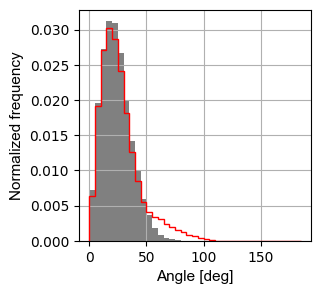

###########################
###########################
###########################
CPU times: user 527 ms, sys: 1.41 s, total: 1.94 s
Wall time: 394 ms


In [60]:
%%time

folder_names_angle_eval="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/opt_test_1/"

names_ini1="x_opt_test_ba_1_"
names_angle_eval=[[names_ini1+str(l+0)+".h5" for l in range(5)]]

names_angles="Bound motifs angle"
for i in range(len(names_angle_eval)):
    angle_ds_fused_link_distr_ex_1, values_angle_ds_fused_link_ex1=cg_angle_distr_c1_1_bm(folder=folder_names_angle_eval,names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)
    
    fig1=plt.figure(figsize=(3,3))
    ax1 = fig1.add_subplot(111)

    sel_target_angle_distr=ax1.hist(list_values_target_angles_1[5]*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='step',ls="-",color="red")[0]
    sel_angle_distr=ax1.hist(values_angle_ds_fused_link_ex1*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='bar',color="grey")[0]
    print(names_angles)
    print("Fitness ba:",gt_1_1(sel_angle_distr,sel_target_angle_distr))
    ax1.set_ylabel("Normalized frequency",fontname = "Arial",fontsize=11)
    ax1.set_xlabel("Angle [deg]",fontname = "Arial",fontsize=11)
    ax1.grid()
    plt.show()
    print("###########################")
    print("###########################")
    print("###########################")


# Fitness evolution

## Arm axis angle

Parameter set 0


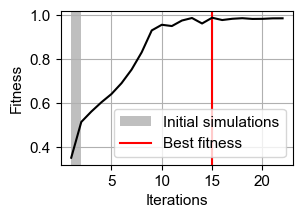

In [61]:
for index, row in df_t1.iterrows():
    fig1=plt.figure(figsize=(3,2))
    #fig, ax1 = plt.subplots(1, 1)
    ax1 = fig1.add_subplot(111)
    fitness_range_l=0.4
    fitness_range_h=1
    fitness_range_step=4
    iterations_step=5
    init_sim_range=2
    
    param_set=row["Set of indep params"]
    param_set_name="Parameter set "+str(param_set)
    print(param_set_name)
    iterations_l=np.arange(1,len(row["f train"])+1)
    param_value_range=(0.0,0.2,0.4,0.6,0.8,1.0) #(10**-22,2.5*10**-19,5*10**-19,7.5*10**-19,10**-18)  #=np.linspace(10**-22, 10**-18,5)  #np.arange(0,6,1) 
    fitnes_range=np.linspace(fitness_range_l,fitness_range_h,fitness_range_step)
    ax1.errorbar(iterations_l,row["f train"],color="black")
    id_max_fitnes=np.argmax(row["f train"])
    
    ax1.axvspan(1, init_sim_range, facecolor='grey', alpha=0.5,label="Initial simulations")
    ax1.axvline(iterations_l[id_max_fitnes],color="red",label="Best fitness")
    ax1.set_ylabel("Fitness",fontname = "Arial",fontsize=11)
    ax1.set_xlabel("Iterations",fontname = "Arial",fontsize=11)
    #ax1.set_xticks(iterations_l[::iterations_step],iterations_l[::iterations_step],fontname = "Arial",fontsize=11)
    ax1.set_xticks([5,10,15,20],[5,10,15,20],fontname = "Arial",fontsize=11)
    ax1.set_yticks(fitnes_range,fitnes_range ,fontname= "Arial",fontsize=11)
    ax1.legend(loc="lower right",prop={'family': 'Arial','size': 11})
    ax1.grid()
    #plt.savefig("/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_4/figures/fitness_arm_axis_angle_2b.pdf",format="pdf",bbox_inches="tight")


## Base+ oppa angle

Parameter set 0
Parameter set 1


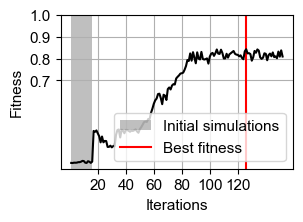

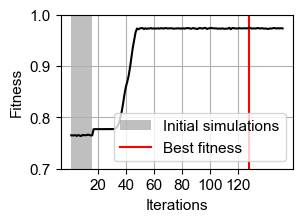

In [21]:
for index, row in df_t2.iterrows():
    fig1=plt.figure(figsize=(3,2))
    #fig, ax1 = plt.subplots(1, 1)
    ax1 = fig1.add_subplot(111)
    fitness_range_l=0.7
    fitness_range_h=1
    fitness_range_step=4
    iterations_step=20
    init_sim_range=16
    
    param_set=row["Set of indep params"]
    param_set_name="Parameter set "+str(param_set)
    print(param_set_name)
    iterations_l=np.arange(1,len(row["f train"])+1)
    param_value_range=(0.0,0.2,0.4,0.6,0.8,1.0) #(10**-22,2.5*10**-19,5*10**-19,7.5*10**-19,10**-18)  #=np.linspace(10**-22, 10**-18,5)  #np.arange(0,6,1) 
    fitnes_range=np.round(np.linspace(fitness_range_l,fitness_range_h,fitness_range_step),1)
    ax1.errorbar(iterations_l,row["f train"],color="black")
    id_max_fitnes=np.argmax(row["f train"])
    
    ax1.axvspan(1, init_sim_range, facecolor='grey', alpha=0.5,label="Initial simulations")
    ax1.axvline(iterations_l[id_max_fitnes],color="red",label="Best fitness")
    ax1.set_ylabel("Fitness",fontname = "Arial",fontsize=11)
    ax1.set_xlabel("Iterations",fontname = "Arial",fontsize=11)
    #ax1.set_xticks(iterations_l[::iterations_step],iterations_l[::iterations_step],fontname = "Arial",fontsize=11)
    ax1.set_xticks([20,40,60,80,100,120],[20,40,60,80,100,120],fontname = "Arial",fontsize=11)
    ax1.set_yticks(fitnes_range,fitnes_range ,fontname= "Arial",fontsize=11)
    ax1.legend(loc="lower right",prop={'family': 'Arial','size': 11})
    ax1.grid()
    #if param_set==0:
        #plt.savefig("/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_4/figures/fitness_base_oppa_angle_2b.pdf",format="pdf",bbox_inches="tight")


## Bound arms angle

Parameter set 0


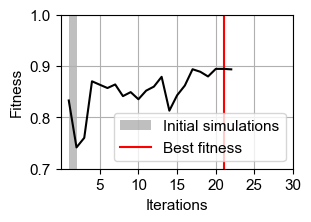

In [22]:
for index, row in df_t4.iterrows():
    fig1=plt.figure(figsize=(3,2))
    #fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True)
    ax1 = fig1.add_subplot(111)
    fitness_range_l=0.7
    fitness_range_h=1
    fitness_range_step=4
    iterations_step=5
    init_sim_range=2
    
    param_set=row["Set of indep params"]
    param_set_name="Parameter set "+str(param_set)
    print(param_set_name)
    iterations_l=np.arange(1,len(row["f train"])+1)
    param_value_range=(0.0,0.2,0.4,0.6,0.8,1.0) #(10**-22,2.5*10**-19,5*10**-19,7.5*10**-19,10**-18)  #=np.linspace(10**-22, 10**-18,5)  #np.arange(0,6,1) 
    fitnes_range=np.round(np.linspace(fitness_range_l,fitness_range_h,fitness_range_step),1)
    ax1.errorbar(iterations_l,row["f train"],color="black")
    id_max_fitnes=np.argmax(row["f train"])
    
    ax1.axvspan(1, init_sim_range, facecolor='grey', alpha=0.5,label="Initial simulations")
    ax1.axvline(iterations_l[id_max_fitnes],color="red",label="Best fitness")
    ax1.set_ylabel("Fitness",fontname = "Arial",fontsize=11)
    ax1.set_xlabel("Iterations",fontname = "Arial",fontsize=11)
    #ax1.set_xticks(iterations_l[::iterations_step],iterations_l[::iterations_step],fontname = "Arial",fontsize=11)
    ax1.set_xticks([5,10,15,20,25,30],[5,10,15,20,25,30],fontname = "Arial",fontsize=11)
    ax1.set_yticks(fitnes_range,fitnes_range ,fontname= "Arial",fontsize=11)
    ax1.legend(loc="lower right",prop={'family': 'Arial','size': 11})
    ax1.grid()
    #plt.savefig("/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_4/figures/fitness_bound_arms_angle_2b.pdf",format="pdf",bbox_inches="tight")


Parameter set 0
Parameter set 1


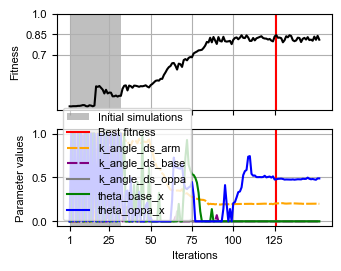

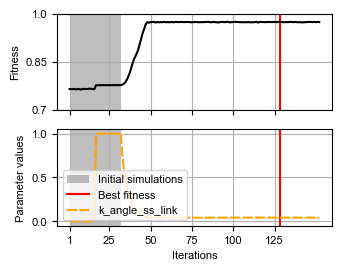

In [27]:
colors_rs_params=["orange","purple","grey","green","blue"]
fmt_rs_params=[(0, (5, 1)),(0, (5, 1)),"-","-","-"]
for index, row in df_t2.iterrows():
    #fig1=plt.figure(figsize=(6,3))
    #fig1=plt.figure(figsize=(7/2.54,3.5/2.54)) 
    fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True,figsize=(9/2.54,7/2.54))
    fs1=8
    #ax1 = fig1.add_subplot(111)
    fitness_range_l=0.7
    fitness_range_h=1
    fitness_range_step=3
    iterations_step=20
    init_sim_range=32
    
    param_set=row["Set of indep params"]
    param_set_name="Parameter set "+str(param_set)
    print(param_set_name)
    iterations_l=np.arange(1,len(row["f train"])+1)
    iteraltions_l_label=[1,25,50,75,100,125]
    param_value_range=(0.0,0.5,1.0) #(10**-22,2.5*10**-19,5*10**-19,7.5*10**-19,10**-18)  #=np.linspace(10**-22, 10**-18,5)  #np.arange(0,6,1)
    fitnes_range=np.round(np.linspace(fitness_range_l,fitness_range_h,fitness_range_step),2)
    ax1.errorbar(iterations_l,row["f train"],color="black")
    id_max_fitnes=np.argmax(row["f train"])
    
    ax1.axvspan(1, init_sim_range, facecolor='grey', alpha=0.5,label="Initial simulations")
    ax1.axvline(iterations_l[id_max_fitnes],color="red",label="Best fitness")
    ax1.set_ylabel("Fitness",fontname = "Arial",fontsize=fs1)
    #ax1.set_xlabel("Iterations",fontname = "Arial",fontsize=11)
    ax1.set_xticks(iterations_l[::iterations_step],iterations_l[::iterations_step],fontname = "Arial",fontsize=fs1)
    #ax1.set_xticks(iteraltions_l_label,iteraltions_l_label,fontname = "Arial",fontsize=fs1)

    ax1.set_yticks(fitnes_range,fitnes_range ,fontname= "Arial",fontsize=fs1)
    #ax1.legend(loc="lower left",prop={'family': 'Arial','size': fs1})
    ax1.grid()
    
    
    #for j in range(len(row["x train rs"][0])):
       # param_name=row["Param names in set"][j]
       # ax2.errorbar(iterations_l,[sublist[j] for sublist in row["x train rs"]],label=param_name)

    for j in range(len(row["x train rs"][0])):
        param_name=row["Param names in set"][j]
        param_sel=[sublist[j] for sublist in row["x train rs"]]
        scaler_param_sel=MinMaxScaler2()
        param_sel_range=df_var_params_2[df_var_params_2["Param names"]==param_name]["Param values"].to_numpy()[0]
        scaler_param_sel.fit(param_sel_range)
        param_sel_rs=scaler_param_sel.transform(param_sel)
        ax2.errorbar(iterations_l,param_sel_rs,label=param_name,color=colors_rs_params[j],linestyle=fmt_rs_params[j])
        
    ax2.axvspan(1, init_sim_range, facecolor='grey', alpha=0.5,label="Initial simulations")
    ax2.axvline(iterations_l[id_max_fitnes],color="red",label="Best fitness")
    ax2.set_xlabel("Iterations",fontname = "Arial",fontsize=fs1)
    ax2.set_ylabel("Parameter values",fontname = "Arial",fontsize=fs1)
    #plt.ylim(10**-22,0.1*10**-18)
    ax2.set_yticks(param_value_range,param_value_range,fontname = "Arial",fontsize=fs1)
    ax2.set_xticks(iteraltions_l_label,iteraltions_l_label,fontname = "Arial",fontsize=fs1)

    #ax2.yaxis.set_major_formatter(matplotlib.ticker.FormatStrFormatter('%.1f'))
    ax2.legend(loc="lower left",prop={'family': 'Arial','size': fs1})
    ax2.grid()
    #plt.show()
    save_name_1="ML_parameter_opt_1/NCG_X_motif_conrad_1/figures/fitness_base_oppa_link_"+str(index)+"_1.pdf"
    #plt.savefig(save_name_1,format="pdf",bbox_inches="tight")


# Compare optimized and unoptimized simulations

## Arm axis angle

CPU times: user 164 ms, sys: 111 ms, total: 275 ms
Wall time: 2.18 s


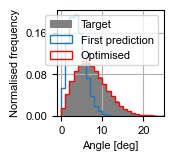

In [28]:
%%time
#guess parameter in middle of range
#folder_names_init_sim="ML_parameter_opt_1/NCG_X_motif_4/unopt_test_2/"
#names_ini1="x_test_1_"

#sim from optimization
folder_names_init_sim="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/opt_v2/aa_ba_oa_la_opt_1/"
names_ini1="sim_aa_ba_oa_la_opt_1_"

#opt simulations
folder_names_opt_sim1="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/opt_v2/opt_sim_1/"
#folder_names_opt_sim2="ML_parameter_opt_1/NCG_X_motif_3/opt_test_2/"
#folder_names_opt_sim3="ML_parameter_opt_1/NCG_X_motif_3/opt_test_3/"

names_opt1="x_opt_test_1_"
#names_opt2="x_opt_test_2_"
#names_opt3="x_opt_test_3_"

names_angle_eval=[[names_ini1+str(l+181)+".h5" for l in range(5)]
                 ,[names_opt1+str(l+0)+".h5" for l in range(5)]]

folders_angle_eval=[folder_names_init_sim,
                   folder_names_opt_sim1]

colours_l=["tab:blue","red"]
names_l=["First prediction","Optimised"]

fig1=plt.figure(figsize=(3.5/2.54,3.5/2.54))        #(3,3)
ax1 = fig1.add_subplot(111)
sel_target_angle_distr=ax1.hist(values_angle_arm_axis_target*180/np.pi,bins=np.arange(0,190,1),density=True, histtype='bar',ls="-",color="grey",label="Target")[0]

for i in range(len(names_angle_eval)):
    base_angle_distr_ex_1,link_angle_distr_ex_1,arm_axis_angle_distr_ex_1,oppa_angle_distr_ex_1     ,values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1,values_angle_oppa_ex_test_1=cg_angle_distr_c1_4_ba_aa_oa_la(folder=folders_angle_eval[i],names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)
    list_angles_eval=[values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1,values_angle_oppa_ex_test_1]

    sel_angle_distr=ax1.hist(values_angle_arm_axis_ex_1*180/np.pi,bins=np.arange(0,190,1),density=True,color=colours_l[i], histtype='step',label=names_l[i])[0]

fs1=8
plt.xlim(-1,25)
ax1.legend(loc="upper right",prop={'family': 'Arial','size': fs1})
ax1.set_ylabel("Normalised frequency",fontname = "Arial",fontsize=fs1)
ax1.set_xlabel("Angle [deg]",fontname = "Arial",fontsize=fs1)
plt.xticks([0,10,20],fontname = "Arial",fontsize=fs1)
plt.yticks([0,0.08,0.16],fontname = "Arial",fontsize=fs1)

ax1.grid()

#plt.savefig("ML_parameter_opt_1/NCG_X_motif_conrad_1/figures/opt_arm_axis_angle_1.pdf",format="pdf",bbox_inches="tight")



## Base angle

CPU times: user 92.5 ms, sys: 127 ms, total: 219 ms
Wall time: 2.17 s


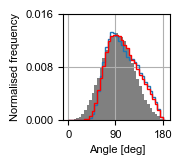

In [30]:
%%time

#guess parameter in middle of range
#folder_names_init_sim="ML_parameter_opt_1/NCG_X_motif_4/unopt_test_2/"
#names_ini1="x_test_1_"

#sim from optimization
folder_names_init_sim="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/opt_v2/aa_ba_oa_la_opt_1/"
names_ini1="sim_aa_ba_oa_la_opt_1_"

#opt simulations
folder_names_opt_sim1="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/opt_v2/opt_sim_1/"
#folder_names_opt_sim2="ML_parameter_opt_1/NCG_X_motif_3/opt_test_2/"
#folder_names_opt_sim3="ML_parameter_opt_1/NCG_X_motif_3/opt_test_3/"

names_opt1="x_opt_test_1_"
#names_opt2="x_opt_test_2_"
#names_opt3="x_opt_test_3_"

names_angle_eval=[[names_ini1+str(l+181)+".h5" for l in range(5)]
                 ,[names_opt1+str(l+0)+".h5" for l in range(5)]]

folders_angle_eval=[folder_names_init_sim,
                   folder_names_opt_sim1]

colours_l=["tab:blue","red"]
names_l=["First prediction","Optimised"]

fig1=plt.figure(figsize=(3.5/2.54,3.5/2.54)) 
ax1 = fig1.add_subplot(111)
sel_target_angle_distr=ax1.hist(values_angle_base_target*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='bar',ls="-",color="grey",label="Target")[0]


for i in range(len(names_angle_eval)):
    base_angle_distr_ex_1,link_angle_distr_ex_1,arm_axis_angle_distr_ex_1,oppa_angle_distr_ex_1     ,values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1,values_angle_oppa_ex_test_1=cg_angle_distr_c1_4_ba_aa_oa_la(folder=folders_angle_eval[i],names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)
    list_angles_eval=[values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1,values_angle_oppa_ex_test_1]

    sel_angle_distr=ax1.hist(values_angle_base_ex_1*180/np.pi,bins=np.arange(0,190,5),density=True, color=colours_l[i],histtype='step',label=names_l[i])[0]

fs1=8
#plt.xlim(-1,50)
#ax1.legend(loc="lower center",prop={'family': 'Arial','size': fs1})
ax1.set_ylabel("Normalised frequency",fontname = "Arial",fontsize=fs1)
ax1.set_xlabel("Angle [deg]",fontname = "Arial",fontsize=fs1)
plt.xticks([0,90,180],fontname = "Arial",fontsize=fs1)
plt.yticks([0,0.008,0.016],fontname = "Arial",fontsize=fs1)
ax1.grid()

#plt.savefig("ML_parameter_opt_1/NCG_X_motif_conrad_1/figures/opt_base_angle_1.pdf",format="pdf",bbox_inches="tight")




## Oppa angle

CPU times: user 105 ms, sys: 103 ms, total: 208 ms
Wall time: 2.09 s


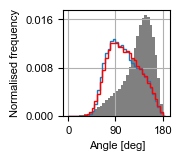

In [32]:
%%time
#guess parameter in middle of range
#folder_names_init_sim="ML_parameter_opt_1/NCG_X_motif_4/unopt_test_2/"
#names_ini1="x_test_1_"

#sim from optimization
folder_names_init_sim="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/opt_v2/aa_ba_oa_la_opt_1/"
names_ini1="sim_aa_ba_oa_la_opt_1_"

#opt simulations
folder_names_opt_sim1="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/opt_v2/opt_sim_1/"
#folder_names_opt_sim2="ML_parameter_opt_1/NCG_X_motif_3/opt_test_2/"
#folder_names_opt_sim3="ML_parameter_opt_1/NCG_X_motif_3/opt_test_3/"

names_opt1="x_opt_test_1_"
#names_opt2="x_opt_test_2_"
#names_opt3="x_opt_test_3_"

names_angle_eval=[[names_ini1+str(l+181)+".h5" for l in range(5)]
                 ,[names_opt1+str(l+0)+".h5" for l in range(5)]]

folders_angle_eval=[folder_names_init_sim,
                   folder_names_opt_sim1]

colours_l=["tab:blue","red"]
names_l=["First prediction","Optimised"]


fig1=plt.figure(figsize=(3.5/2.54,3.5/2.54)) 
ax1 = fig1.add_subplot(111)
sel_target_angle_distr=ax1.hist(values_angle_oppa_target*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='bar',ls="-",color="grey",label="Target")[0]

for i in range(len(names_angle_eval)):
    base_angle_distr_ex_1,link_angle_distr_ex_1,arm_axis_angle_distr_ex_1,oppa_angle_distr_ex_1     ,values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1,values_angle_oppa_ex_test_1=cg_angle_distr_c1_4_ba_aa_oa_la(folder=folders_angle_eval[i],names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)
    list_angles_eval=[values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1,values_angle_oppa_ex_test_1]

    sel_angle_distr=ax1.hist(values_angle_oppa_ex_test_1*180/np.pi,bins=np.arange(0,190,5),density=True,color=colours_l[i], histtype='step',label=names_l[i])[0]

fs1=8
#plt.xlim(-1,50)
#ax1.legend(loc="upper left",prop={'family': 'Arial','size': fs1})
ax1.set_ylabel("Normalised frequency",fontname = "Arial",fontsize=fs1)
ax1.set_xlabel("Angle [deg]",fontname = "Arial",fontsize=fs1)
plt.xticks([0,90,180],fontname = "Arial",fontsize=fs1)
plt.yticks([0,0.008,0.016],fontname = "Arial",fontsize=fs1)
ax1.grid()


#plt.savefig("ML_parameter_opt_1/NCG_X_motif_conrad_1/figures/opt_oppa_angle_1.pdf",format="pdf",bbox_inches="tight")



## Link angle

CPU times: user 121 ms, sys: 99.1 ms, total: 220 ms
Wall time: 2.85 s


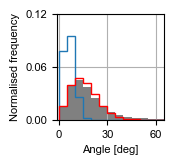

In [35]:
%%time
#guess parameter in middle of range
#folder_names_init_sim="ML_parameter_opt_1/NCG_X_motif_4/unopt_test_2/"
#names_ini1="x_test_1_"

#sim from optimization
folder_names_init_sim="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/opt_v2/aa_ba_oa_la_opt_1/"
names_ini1="sim_aa_ba_oa_la_opt_1_"

#opt simulations
folder_names_opt_sim1="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/opt_v2/opt_sim_1/"
#folder_names_opt_sim2="ML_parameter_opt_1/NCG_X_motif_3/opt_test_2/"
#folder_names_opt_sim3="ML_parameter_opt_1/NCG_X_motif_3/opt_test_3/"

names_opt1="x_opt_test_1_"
#names_opt2="x_opt_test_2_"
#names_opt3="x_opt_test_3_"

names_angle_eval=[[names_ini1+str(l+181)+".h5" for l in range(5)]
                 ,[names_opt1+str(l+0)+".h5" for l in range(5)]]

folders_angle_eval=[folder_names_init_sim,
                   folder_names_opt_sim1]

colours_l=["tab:blue","red"]
names_l=["First prediction","Optimised"]


fig1=plt.figure(figsize=(3.5/2.54,3.5/2.54)) 
ax1 = fig1.add_subplot(111)
sel_target_angle_distr=ax1.hist(values_angle_link_target*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='bar',ls="-",color="grey",label="Target")[0]

for i in range(len(names_angle_eval)):
    base_angle_distr_ex_1,link_angle_distr_ex_1,arm_axis_angle_distr_ex_1,oppa_angle_distr_ex_1     ,values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1,values_angle_oppa_ex_test_1=cg_angle_distr_c1_4_ba_aa_oa_la(folder=folders_angle_eval[i],names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)
    list_angles_eval=[values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1,values_angle_oppa_ex_test_1]

    sel_angle_distr=ax1.hist(values_angle_link_ex_1*180/np.pi,bins=np.arange(0,190,5),density=True, color=colours_l[i],histtype='step',label=names_l[i])[0]

fs1=8
plt.xlim(-1,65)
#ax1.legend(loc="upper right",prop={'family': 'Arial','size': fs1})
ax1.set_ylabel("Normalised frequency",fontname = "Arial",fontsize=fs1)
ax1.set_xlabel("Angle [deg]",fontname = "Arial",fontsize=fs1)
plt.xticks([0,30,60],fontname = "Arial",fontsize=fs1)
plt.yticks([0,0.06,0.12],fontname = "Arial",fontsize=fs1)
ax1.grid()


#plt.savefig("ML_parameter_opt_1/NCG_X_motif_conrad_1/figures/opt_link_angle_1.pdf",format="pdf",bbox_inches="tight")



## HP link angle

CPU times: user 104 ms, sys: 107 ms, total: 211 ms
Wall time: 2.84 s


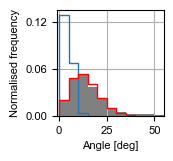

In [36]:
%%time

#guess parameter in middle of range
#folder_names_init_sim="ML_parameter_opt_1/NCG_X_motif_4/unopt_test_2/"
#names_ini1="x_test_hp_1_"

#sim from optimization
folder_names_init_sim="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/opt_v2/hp_opt_1/"
names_ini1="sim_hp_opt_1_"

#opt simulations
folder_names_opt_sim1="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/opt_v2/opt_sim_1/"
#folder_names_opt_sim2="ML_parameter_opt_1/NCG_X_motif_3/opt_test_2/"
#folder_names_opt_sim3="ML_parameter_opt_1/NCG_X_motif_3/opt_test_3/"

names_opt1="x_opt_test_hp_1_"
#names_opt2="x_opt_test_hp_2_"
#names_opt3="x_opt_test_hp_3_"

names_angle_eval=[[names_ini1+str(l+11)+".h5" for l in range(5)]
                 ,[names_opt1+str(l+0)+".h5" for l in range(5)]]

folders_angle_eval=[folder_names_init_sim,
                   folder_names_opt_sim1]

colours_l=["tab:blue","red"]
names_l=["First prediction","Optimised"]


fig1=plt.figure(figsize=(3.5/2.54,3.5/2.54)) 
ax1 = fig1.add_subplot(111)
sel_target_angle_distr=ax1.hist(values_angle_link_HP_target*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='bar',ls="-",color="grey",label="Target")[0]

for i in range(len(names_angle_eval)):
    link_angle_distr_ex_1, values_angle_link_ex1=cg_angle_distr_c1_1_hp(folder=folders_angle_eval[i],names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)

    sel_angle_distr=ax1.hist(values_angle_link_ex1*180/np.pi,bins=np.arange(0,190,5),density=True,color=colours_l[i], histtype='step',label=names_l[i])[0]

fs1=8
plt.xlim(-1,55)
#ax1.legend(loc="upper right",prop={'family': 'Arial','size': fs1})
ax1.set_ylabel("Normalised frequency",fontname = "Arial",fontsize=fs1)
ax1.set_xlabel("Angle [deg]",fontname = "Arial",fontsize=fs1)
plt.xticks([0,25,50],fontname = "Arial",fontsize=fs1)
plt.yticks([0,0.06,0.12],fontname = "Arial",fontsize=fs1)
ax1.grid()


#plt.savefig("ML_parameter_opt_1/NCG_X_motif_conrad_1/figures/opt_HP_link_angle_1.pdf",format="pdf",bbox_inches="tight")



## bound arms angle

CPU times: user 46 ms, sys: 103 ms, total: 149 ms
Wall time: 600 ms


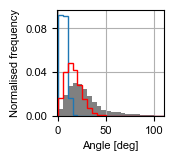

In [38]:
%%time

#guess parameter in middle of range
#folder_names_init_sim="ML_parameter_opt_1/NCG_X_motif_4/unopt_test_2/"
#names_ini1="x_test_ba_1_"

#sim from optimization
folder_names_init_sim="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/opt_v2/bm_opt_1/"
names_ini1="sim_bm_opt_1_"

#opt simulations
folder_names_opt_sim1="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/opt_v2/opt_sim_1/"
#folder_names_opt_sim2="ML_parameter_opt_1/NCG_X_motif_3/opt_test_2/"
#folder_names_opt_sim3="ML_parameter_opt_1/NCG_X_motif_3/opt_test_3/"

names_opt1="x_opt_test_ba_1_"
#names_opt2="x_opt_test_ba_2_"
#names_opt3="x_opt_test_ba_3_"

names_angle_eval=[[names_ini1+str(l+11)+".h5" for l in range(5)]
                 ,[names_opt1+str(l+0)+".h5" for l in range(5)]]

folders_angle_eval=[folder_names_init_sim,
                   folder_names_opt_sim1]

colours_l=["tab:blue","red"]
names_l=["First prediction","Optimised"]


fig1=plt.figure(figsize=(3.5/2.54,3.5/2.54)) 
ax1 = fig1.add_subplot(111)
sel_target_angle_distr=ax1.hist(values_angle_ds_fused_link_target*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='bar',ls="-",color="grey",label="Target")[0]

for i in range(len(names_angle_eval)):
    angle_ds_fused_link_distr_ex_1, values_angle_ds_fused_link_ex1=cg_angle_distr_c1_1_bm(folder=folders_angle_eval[i],names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)

    sel_angle_distr=ax1.hist(values_angle_ds_fused_link_ex1*180/np.pi,bins=np.arange(0,190,5),density=True,color=colours_l[i], histtype='step',label=names_l[i])[0]

fs1=8
plt.xlim(-1,110)
#ax1.legend(loc="upper right",prop={'family': 'Arial','size': fs1})
ax1.set_ylabel("Normalised frequency",fontname = "Arial",fontsize=fs1)
ax1.set_xlabel("Angle [deg]",fontname = "Arial",fontsize=fs1)
plt.xticks([0,50,100],fontname = "Arial",fontsize=fs1)
plt.yticks([0,0.04,0.08],fontname = "Arial",fontsize=fs1)
ax1.grid()


#plt.savefig("ML_parameter_opt_1/NCG_X_motif_conrad_1/figures/opt_bound_arms_angle_1.pdf",format="pdf",bbox_inches="tight")



# Compare split and combined optimization

In [95]:
%%time

#get list of wasserstein distances of validation sims
w_dist_aa_list2=[]
w_dist_ba_list2=[]
w_dist_oa_list2=[]
w_dist_la_list2=[]

w_dist_hp_list2=[]

w_dist_bm_list2=[]

#fitnes
ft_aa_list2=[]
ft_ba_list2=[]
ft_oa_list2=[]
ft_la_list2=[]
ft_hp_list2=[]
ft_bm_list2=[]

#ks test
ks_aa_list2=[]
ks_ba_list2=[]
ks_oa_list2=[]
ks_la_list2=[]
ks_hp_list2=[]
ks_bm_list2=[]


for j in [0,1,2]:
    folder_n="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/opt_v2/"
    
    #get target angles
    
    #sel_val_target=i
    
    
    #get optimized angles
    
    #aa, ba, op, la
    folder_val_t=folder_n+"opt_sim_1/"
    names_val_t=["x_opt_test_1_"+str(l+j)+".h5" for l in range(5)]
    base_angle_distr_ex_1,link_angle_distr_ex_1,arm_axis_angle_distr_ex_1,oppa_angle_distr_ex_1     ,values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1,values_angle_oppa_ex_test_1=cg_angle_distr_c1_4_ba_aa_oa_la(folder=folder_val_t,names_sim_repeat=names_val_t,t_skip=300,t_lim=None,t_step=1)
    list_angles_eval=[values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1,values_angle_oppa_ex_test_1]
    
    #hp
    folder_val_t2=folder_n+"opt_sim_1/"
    names_val_t2=["x_opt_test_hp_1_"+str(l+j)+".h5" for l in range(5)]
    link_hp_angle_distr_ex_1, values_angle_link_hp_ex1=cg_angle_distr_c1_1_hp(folder=folder_val_t2,names_sim_repeat=names_val_t2,t_skip=300,t_lim=None,t_step=1)
    
    #bm
    folder_val_t2=folder_n+"opt_sim_1/"
    names_val_t2=["x_opt_test_ba_1_"+str(l+j)+".h5" for l in range(5)]
    angle_ds_fused_link_distr_ex_1, values_angle_ds_fused_link_ex1=cg_angle_distr_c1_1_bm(folder=folder_val_t2,names_sim_repeat=names_val_t2,t_skip=300,t_lim=None,t_step=1)
    
    
    w_dist_aa=wasserstein_distance(values_angle_arm_axis_target,values_angle_arm_axis_ex_1)
    w_dist_ba=wasserstein_distance(values_angle_base_target,values_angle_base_ex_1)
    w_dist_oa=wasserstein_distance(values_angle_oppa_target,values_angle_oppa_ex_test_1)
    w_dist_la=wasserstein_distance(values_angle_link_target,values_angle_link_ex_1)
    w_dist_hp=wasserstein_distance(values_angle_link_HP_target,values_angle_link_hp_ex1)
    w_dist_bm=wasserstein_distance(values_angle_ds_fused_link_target,values_angle_ds_fused_link_ex1)
    
    w_dist_aa_list2.append(w_dist_aa)
    w_dist_ba_list2.append(w_dist_ba)
    w_dist_oa_list2.append(w_dist_oa)
    w_dist_la_list2.append(w_dist_la)
    w_dist_hp_list2.append(w_dist_hp)
    w_dist_bm_list2.append(w_dist_bm)
    
    
    '''
    ft_aa_list2.append(gt_1_1(arm_axis_angle_distr_target,arm_axis_angle_distr_ex_1))
    ft_ba_list2.append(gt_1_1(base_angle_distr_target,base_angle_distr_ex_1))
    ft_oa_list2.append(gt_1_1(oppa_angle_distr_target,oppa_angle_distr_ex_1))
    ft_la_list2.append(gt_1_1(link_angle_distr_target,link_angle_distr_ex_1))
    ft_hp_list2.append(gt_1_1(link_HP_angle_distr_target,link_hp_angle_distr_ex_1))
    ft_bm_list2.append(gt_1_1(angle_ds_fused_link_distr_target,angle_ds_fused_link_distr_ex_1))
    
    
    ks_aa_list2.append(kstest(values_angle_arm_axis_target,values_angle_arm_axis_ex_1)[1])
    ks_ba_list2.append(kstest(values_angle_base_target,values_angle_base_ex_1)[1])
    ks_oa_list2.append(kstest(values_angle_oppa_target,values_angle_oppa_ex_test_1)[1])
    ks_la_list2.append(kstest(values_angle_link_target,values_angle_link_ex_1)[1])
    ks_hp_list2.append(kstest(values_angle_link_HP_target,values_angle_link_hp_ex1)[1])
    ks_bm_list2.append(kstest(values_angle_ds_fused_link_target,values_angle_ds_fused_link_ex1)[1])'''

CPU times: user 767 ms, sys: 558 ms, total: 1.33 s
Wall time: 7.86 s


In [109]:
%%time

#get list of wasserstein distances of validation sims
w_dist_aa_list1=[]
w_dist_ba_list1=[]
w_dist_oa_list1=[]
w_dist_la_list1=[]

w_dist_hp_list1=[]

w_dist_bm_list1=[]

#fitnes
ft_aa_list1=[]
ft_ba_list1=[]
ft_oa_list1=[]
ft_la_list1=[]
ft_hp_list1=[]
ft_bm_list1=[]

#ks test
ks_aa_list1=[]
ks_ba_list1=[]
ks_oa_list1=[]
ks_la_list1=[]
ks_hp_list1=[]
ks_bm_list1=[]


for j in [0,1,2]:
    folder_n="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/"
    
    #get target angles
    
    #sel_val_target=i
    
    
    #get optimized angles
    
    #aa, ba, op, la
    folder_val_t=folder_n+"opt_test_1/"
    names_val_t=["x_opt_test_1_"+str(l+j)+".h5" for l in range(5)]
    base_angle_distr_ex_1,link_angle_distr_ex_1,arm_axis_angle_distr_ex_1,oppa_angle_distr_ex_1     ,values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1,values_angle_oppa_ex_test_1=cg_angle_distr_c1_4_ba_aa_oa_la(folder=folder_val_t,names_sim_repeat=names_val_t,t_skip=300,t_lim=None,t_step=1)
    list_angles_eval=[values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1,values_angle_oppa_ex_test_1]
    
    #hp
    folder_val_t2=folder_n+"opt_test_1/"
    names_val_t2=["x_opt_test_hp_1_"+str(l+j)+".h5" for l in range(5)]
    link_hp_angle_distr_ex_1, values_angle_link_hp_ex1=cg_angle_distr_c1_1_hp(folder=folder_val_t2,names_sim_repeat=names_val_t2,t_skip=300,t_lim=None,t_step=1)
    
    #bm
    folder_val_t2=folder_n+"opt_test_1/"
    names_val_t2=["x_opt_test_ba_1_"+str(l+j)+".h5" for l in range(5)]
    angle_ds_fused_link_distr_ex_1, values_angle_ds_fused_link_ex1=cg_angle_distr_c1_1_bm(folder=folder_val_t2,names_sim_repeat=names_val_t2,t_skip=300,t_lim=None,t_step=1)
    
    
    w_dist_aa=wasserstein_distance(values_angle_arm_axis_target,values_angle_arm_axis_ex_1)
    w_dist_ba=wasserstein_distance(values_angle_base_target,values_angle_base_ex_1)
    w_dist_oa=wasserstein_distance(values_angle_oppa_target,values_angle_oppa_ex_test_1)
    w_dist_la=wasserstein_distance(values_angle_link_target,values_angle_link_ex_1)
    w_dist_hp=wasserstein_distance(values_angle_link_HP_target,values_angle_link_hp_ex1)
    w_dist_bm=wasserstein_distance(values_angle_ds_fused_link_target,values_angle_ds_fused_link_ex1)
    
    w_dist_aa_list1.append(w_dist_aa)
    w_dist_ba_list1.append(w_dist_ba)
    w_dist_oa_list1.append(w_dist_oa)
    w_dist_la_list1.append(w_dist_la)
    w_dist_hp_list1.append(w_dist_hp)
    w_dist_bm_list1.append(w_dist_bm)
    
    
    '''
    ft_aa_list1.append(gt_1_1(arm_axis_angle_distr_target,arm_axis_angle_distr_ex_1))
    ft_ba_list1.append(gt_1_1(base_angle_distr_target,base_angle_distr_ex_1))
    ft_oa_list1.append(gt_1_1(oppa_angle_distr_target,oppa_angle_distr_ex_1))
    ft_la_list1.append(gt_1_1(link_angle_distr_target,link_angle_distr_ex_1))
    ft_hp_list1.append(gt_1_1(link_HP_angle_distr_target,link_hp_angle_distr_ex_1))
    ft_bm_list1.append(gt_1_1(angle_ds_fused_link_distr_target,angle_ds_fused_link_distr_ex_1))
    
    
    ks_aa_list1.append(kstest(values_angle_arm_axis_target,values_angle_arm_axis_ex_1)[1])
    ks_ba_list1.append(kstest(values_angle_base_target,values_angle_base_ex_1)[1])
    ks_oa_list1.append(kstest(values_angle_oppa_target,values_angle_oppa_ex_test_1)[1])
    ks_la_list1.append(kstest(values_angle_link_target,values_angle_link_ex_1)[1])
    ks_hp_list1.append(kstest(values_angle_link_HP_target,values_angle_link_hp_ex1)[1])
    ks_bm_list1.append(kstest(values_angle_ds_fused_link_target,values_angle_ds_fused_link_ex1)[1])'''

CPU times: user 804 ms, sys: 503 ms, total: 1.31 s
Wall time: 10.3 s


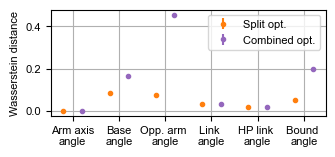

In [129]:
fig1=plt.figure(figsize=(9/2.54,3.5/2.54)  )  #(9/2.54,7/2.54)      #(3,3)   #(3.5/2.54,3.5/2.54)
#fig1=plt.figure(figsize=(9,3.5)  )
ax1 = fig1.add_subplot(111)
x_pos=np.arange(0,6)


ax1.grid()
w_dist_list1=[w_dist_aa_list1,w_dist_ba_list1,w_dist_oa_list1,w_dist_la_list1,w_dist_hp_list1,w_dist_bm_list1]

w_dist_list2=[w_dist_aa_list2,w_dist_ba_list2,w_dist_oa_list2,w_dist_la_list2,w_dist_hp_list2,w_dist_bm_list2]

plt.errorbar(x_pos-0.2,np.mean(w_dist_list1,axis=1),yerr=np.std(w_dist_list1,axis=1)/len(w_dist_list1[0]),fmt=".",color="tab:orange",label="Split opt.")

plt.errorbar(x_pos+0.2,np.mean(w_dist_list2,axis=1),yerr=np.std(w_dist_list2,axis=1)/len(w_dist_list2[0]),fmt=".",color="tab:purple",label="Combined opt.")

#bp_2=plt.boxplot([w_dist_aa_list2,w_dist_ba_list2,w_dist_oa_list2,w_dist_la_list2,w_dist_hp_list2,w_dist_bm_list2],positions=x_pos+0.25,showfliers=s_fliers,notch=True,bootstrap=10000, patch_artist=True, boxprops={'facecolor': 'tab:purple'},medianprops={'color': 'black'},widths=0.2)


fs1=8
#plt.xlim(-1,25)
ax1.legend(prop={'family': 'Arial','size': fs1},loc="upper right")
ax1.set_ylabel("Wasserstein distance",fontname = "Arial",fontsize=fs1)
#ax1.set_xlabel("Angle [deg]",fontname = "Arial",fontsize=fs1)
plt.xticks(x_pos,["Arm axis\nangle","Base\nangle","Opp. arm \nangle","Link \nangle","HP link \nangle","Bound \nangle"],fontname = "Arial",fontsize=fs1)
plt.yticks(fontname = "Arial",fontsize=fs1)

save_name_1="ML_parameter_opt_1/NCG_X_motif_conrad_1/figures/opt_two_methods_wasserstein_1.pdf"
#plt.savefig(save_name_1,format="pdf",bbox_inches="tight")

CPU times: user 1.09 s, sys: 1.36 s, total: 2.45 s
Wall time: 2.43 s


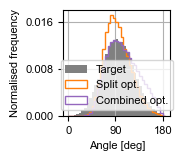

In [121]:
%%time

#compare base angle for split and combiend opt

#sim from split optimization
folder_names_init_sim="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/opt_test_1/"
names_ini1="x_opt_test_1_"

#sim from combined optimization
folder_names_opt_sim1="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/opt_v2/opt_sim_1/"
#folder_names_opt_sim2="ML_parameter_opt_1/NCG_X_motif_3/opt_test_2/"
#folder_names_opt_sim3="ML_parameter_opt_1/NCG_X_motif_3/opt_test_3/"

names_opt1="x_opt_test_1_"
#names_opt2="x_opt_test_2_"
#names_opt3="x_opt_test_3_"

names_angle_eval=[[names_ini1+str(l+0)+".h5" for l in range(5)]
                 ,[names_opt1+str(l+0)+".h5" for l in range(5)]]

folders_angle_eval=[folder_names_init_sim,
                   folder_names_opt_sim1]

colours_l=["tab:orange","tab:purple"]
names_l=["Split opt.","Combined opt."]

fig1=plt.figure(figsize=(3.5/2.54,3.5/2.54)) 
ax1 = fig1.add_subplot(111)
sel_target_angle_distr=ax1.hist(values_angle_base_target*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='bar',ls="-",color="grey",label="Target")[0]


for i in range(len(names_angle_eval)):
    base_angle_distr_ex_1,link_angle_distr_ex_1,arm_axis_angle_distr_ex_1,oppa_angle_distr_ex_1     ,values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1,values_angle_oppa_ex_test_1=cg_angle_distr_c1_4_ba_aa_oa_la(folder=folders_angle_eval[i],names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)
    list_angles_eval=[values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1,values_angle_oppa_ex_test_1]

    sel_angle_distr=ax1.hist(values_angle_base_ex_1*180/np.pi,bins=np.arange(0,190,5),density=True, color=colours_l[i],histtype='step',label=names_l[i])[0]

fs1=8
#plt.xlim(-1,50)
ax1.legend(loc="lower center",prop={'family': 'Arial','size': fs1})
ax1.set_ylabel("Normalised frequency",fontname = "Arial",fontsize=fs1)
ax1.set_xlabel("Angle [deg]",fontname = "Arial",fontsize=fs1)
plt.xticks([0,90,180],fontname = "Arial",fontsize=fs1)
plt.yticks([0,0.008,0.016],fontname = "Arial",fontsize=fs1)
ax1.grid()

#plt.savefig("ML_parameter_opt_1/NCG_X_motif_conrad_1/figures/opt_two_methods_base_angle_1.pdf",format="pdf",bbox_inches="tight")




CPU times: user 846 ms, sys: 1.54 s, total: 2.39 s
Wall time: 2.3 s


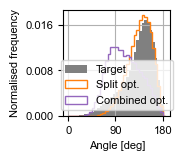

In [122]:
%%time

#compare oppa angle for split and combiend opt

#sim from split optimization
folder_names_init_sim="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/opt_test_1/"
names_ini1="x_opt_test_1_"

#sim from combined optimization
folder_names_opt_sim1="/home/aaron/phd/Nanomotif_Coarse_Graining_1/ML_parameter_opt_1/NCG_X_motif_conrad_1/opt_v2/opt_sim_1/"
#folder_names_opt_sim2="ML_parameter_opt_1/NCG_X_motif_3/opt_test_2/"
#folder_names_opt_sim3="ML_parameter_opt_1/NCG_X_motif_3/opt_test_3/"

names_opt1="x_opt_test_1_"
#names_opt2="x_opt_test_2_"
#names_opt3="x_opt_test_3_"

names_angle_eval=[[names_ini1+str(l+0)+".h5" for l in range(5)]
                 ,[names_opt1+str(l+0)+".h5" for l in range(5)]]

folders_angle_eval=[folder_names_init_sim,
                   folder_names_opt_sim1]

colours_l=["tab:orange","tab:purple"]
names_l=["Split opt.","Combined opt."]

fig1=plt.figure(figsize=(3.5/2.54,3.5/2.54)) 
ax1 = fig1.add_subplot(111)
sel_target_angle_distr=ax1.hist(values_angle_oppa_target*180/np.pi,bins=np.arange(0,190,5),density=True, histtype='bar',ls="-",color="grey",label="Target")[0]


for i in range(len(names_angle_eval)):
    base_angle_distr_ex_1,link_angle_distr_ex_1,arm_axis_angle_distr_ex_1,oppa_angle_distr_ex_1     ,values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1,values_angle_oppa_ex_test_1=cg_angle_distr_c1_4_ba_aa_oa_la(folder=folders_angle_eval[i],names_sim_repeat=names_angle_eval[i],t_skip=300,t_lim=None,t_step=1)
    list_angles_eval=[values_angle_base_ex_1,values_angle_link_ex_1,values_angle_arm_axis_ex_1,values_angle_oppa_ex_test_1]

    sel_angle_distr=ax1.hist(values_angle_oppa_ex_test_1*180/np.pi,bins=np.arange(0,190,5),density=True, color=colours_l[i],histtype='step',label=names_l[i])[0]

fs1=8
#plt.xlim(-1,50)
ax1.legend(loc="lower center",prop={'family': 'Arial','size': fs1})
ax1.set_ylabel("Normalised frequency",fontname = "Arial",fontsize=fs1)
ax1.set_xlabel("Angle [deg]",fontname = "Arial",fontsize=fs1)
plt.xticks([0,90,180],fontname = "Arial",fontsize=fs1)
plt.yticks([0,0.008,0.016],fontname = "Arial",fontsize=fs1)
ax1.grid()

#plt.savefig("ML_parameter_opt_1/NCG_X_motif_conrad_1/figures/opt_two_methods_oppa_angle_1.pdf",format="pdf",bbox_inches="tight")


